<a href="https://colab.research.google.com/github/MeenakshiRajpurohit/perception-aware-dynamic-diffusion-transformers/blob/main/Copy_of_Untitled40.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q torchao

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# PA-D²iT — END-TO-END PIPELINE  ·  CELL 1 / 7  ·  SETUP + DATA
# ----------------------------------------------------------------------
# COMPLETE REPLACEMENT — delete the old Cell 1 and paste this in whole.
#
# Handles the actual cache format found on Drive:
#   * boxes stored in CSR (ragged) form — one flat array plus `offsets`.
#     Indexing it as boxes[k] returns BOX k, not IMAGE k's boxes, which
#     would silently build masks for the wrong pictures rather than failing.
#   * `imps` / `tier` stored as a RENDERED FIELD per box (n, 16, 32), not a
#     scalar. Reduced by MAX, never mean — mean-pooling would let a fully
#     covered car outrank a partly covered pedestrian (innovation I3).
#   * `grain` precomputed, so the importance masks are already done.
#
# Three decisions already made, each forced by a measurement in this project:
#   1. Cityscapes from the existing cache — nothing new is downloaded.
#   2. 6 M parameters, not 159.5 M. The old ratio was ~19 images per million
#      parameters against DiT-XL/2's ~1,896; the guide predicted the result:
#      "a 160 M-param transformer on 3k images will memorise."
#   3. No dynamic patchify — finding 3.2 measured mixed-grain tokenization as
#      net-negative at 41-129x the noise floor, uniform-coarse winning at half
#      the compute. Importance enters through the LOSS WEIGHT instead, which
#      is the half of the proposal that was never tested.
# ════════════════════════════════════════════════════════════════════
import os, sys, json, time, math, gc
import numpy as np, torch, torch.nn as nn, torch.nn.functional as F

ROOT = "/content/drive/MyDrive/pa_d2it"
OUT  = f"{ROOT}/e2e"
for d in ("ckpt", "samples", "logs"): os.makedirs(f"{OUT}/{d}", exist_ok=True)

dev   = "cuda" if torch.cuda.is_available() else "cpu"
BF16  = torch.cuda.is_available() and torch.cuda.is_bf16_supported()
DTYPE = torch.bfloat16 if BF16 else torch.float16
print(f"  {torch.cuda.get_device_name(0) if dev=='cuda' else 'CPU'} · "
      f"{'bf16' if BF16 else 'fp16'}")

PATCH     = 2           # uniform coarse patchify
VAE_SCALE = 0.18215

# ── locate the caches by content, not by filename ──────────────────────
print("\n  scanning for caches …")
_npy, _npz = [], []
for r, _, fs in os.walk(ROOT):
    if "/e2e" in r: continue
    for f in fs:
        if f.endswith(".npy"): _npy.append(os.path.join(r, f))
        elif f.endswith(".npz"): _npz.append(os.path.join(r, f))

IMGS = lay = lat = None
for p in sorted(_npy, key=os.path.getsize, reverse=True):
    try:
        a = np.load(p, mmap_mode="r")
        if a.ndim == 4 and a.shape[-1] == 3 and a.dtype == np.uint8:
            IMGS = a; print(f"    ✓ images   {os.path.relpath(p, ROOT)}  {a.shape}")
            break
    except Exception: pass
for p in sorted(_npz, key=os.path.getsize):
    try:
        z = np.load(p, allow_pickle=True)
        if "boxes" in z and ("clsid" in z or "cls" in z):
            lay = z; print(f"    ✓ layout   {os.path.relpath(p, ROOT)}")
            print(f"               keys {list(z.keys())}")
            break
    except Exception: pass
for p in sorted(_npz, key=os.path.getsize, reverse=True):
    try:
        z = np.load(p)
        if "mean" in z and "std" in z:
            lat = z; print(f"    ✓ latents  {os.path.relpath(p, ROOT)}")
            break
    except Exception: pass
assert IMGS is not None and lay is not None and lat is not None, "cache missing"

IMG_H, IMG_W = IMGS.shape[1], IMGS.shape[2]
LH, LW = IMG_H // 8, IMG_W // 8
GH, GW = LH // PATCH, LW // PATCH
N_TOK  = GH * GW
print(f"    geometry {IMG_H}×{IMG_W} → latent {LH}×{LW} → {N_TOK} tokens")

# ── CSR (ragged) layout → padded per-image tensors ─────────────────────
off = np.asarray(lay["offsets"]).astype(np.int64)
bxf = np.asarray(lay["boxes"], np.float32)
clf = np.asarray(lay["clsid"] if "clsid" in lay else lay["cls"], np.int64)

# tier / importance: per-box scalar OR a rendered field per box.
# Reduce a field by MAX, never mean — see I3.
tif, tif_src = None, None
for key in ("tier", "imps"):
    if key in lay:
        _t = np.asarray(lay[key], np.float32)
        if _t.ndim == 1:
            tif, tif_src = _t, f"{key} (per-box scalar)"
        elif _t.shape[0] == len(bxf):
            tif, tif_src = _t.reshape(len(_t), -1).max(1), f"{key} (field, max-pooled)"
        if tif is not None: break
if tif is not None:
    print(f"    tier from {tif_src} · range [{tif.min():.2f}, {tif.max():.2f}]")

N      = len(off) - 1
counts = np.diff(off)
MAX_B  = int(counts.max())
print(f"    CSR: {len(bxf)} boxes over {N} images · "
      f"max {MAX_B}/image · mean {counts.mean():.1f}")

BOX_np  = np.zeros((N, MAX_B, 4), np.float32)
CLS_np  = np.zeros((N, MAX_B),    np.int64)
TIER_np = np.zeros((N, MAX_B),    np.float32)
for k in range(N):
    a, b = off[k], off[k+1]
    n = min(b - a, MAX_B)
    if n <= 0: continue
    BOX_np[k, :n]  = bxf[a:a+n]
    CLS_np[k, :n]  = clf[a:a+n]
    if tif is not None: TIER_np[k, :n] = tif[a:a+n]

if BOX_np[..., 2].max() > 1.5:                    # pixels, not normalised
    print(f"    boxes are pixel-valued (max {BOX_np[...,2].max():.0f}) → normalising")
    BOX_np[..., 0] /= IMG_W; BOX_np[..., 2] /= IMG_W
    BOX_np[..., 1] /= IMG_H; BOX_np[..., 3] /= IMG_H
BOX_np = np.clip(BOX_np, 0.0, 1.0)

BOX  = torch.from_numpy(BOX_np).to(dev)
CLS  = torch.from_numpy(CLS_np).to(dev)
TIER = torch.from_numpy(TIER_np).to(dev)
USE_TIER = bool(TIER.max() > 0)
print(f"    importance source: {'cached tier values' if USE_TIER else 'class ids'}")

# ── precomputed grain maps, if the cache has them ──────────────────────
GRAIN_CACHED = None
if "grain" in lay:
    _g = np.asarray(lay["grain"])
    if _g.ndim == 3 and _g.shape[0] == N:
        GRAIN_CACHED = torch.from_numpy(_g.astype(np.float32)).to(dev)
        print(f"    cached grain maps {tuple(GRAIN_CACHED.shape)} "
              f"— Cell 2 will reuse these")

LM = torch.from_numpy(np.asarray(lat["mean"])).half()
LS = torch.from_numpy(np.asarray(lat["std"])).half()
if LM.ndim == 4: LM, LS = LM[:, None], LS[:, None]
LM, LS = LM.to(dev), LS.to(dev)
assert LM.shape[0] == N == len(IMGS), \
    f"length mismatch: images {len(IMGS)} layout {N} latents {LM.shape[0]}"

CLASS_NAMES = ["__bg__", "person", "rider", "bicycle", "motorcycle",
               "car", "bus", "truck", "train"]
VRU_IDS, VEH_IDS = [1, 2], [3, 4, 5, 6, 7, 8]

# ── reuse the cache's own split so results stay comparable ─────────────
IDX = None
if "split" in lay:
    sp = np.asarray(lay["split"])
    if sp.dtype.kind in "SU":
        s = sp.astype(str)
        tr, va = np.where(np.char.startswith(s, "tr"))[0], \
                 np.where(np.char.startswith(s, "va"))[0]
    else:
        tr, va = np.where(sp == 0)[0], np.where(sp == 1)[0]
    if len(tr) > 100 and len(va) > 20:
        IDX = {"train": tr, "val": va}; print("    using the cache's own split")
if IDX is None:
    _p = torch.randperm(N, generator=torch.Generator().manual_seed(0)).numpy()
    IDX = {"train": _p[:int(.85*N)], "val": _p[int(.85*N):]}
    print("    using a fresh 85/15 split")

# ── sanity check: do the boxes land on objects? ────────────────────────
_k = int(IDX["train"][0])
_n = int((CLS[_k] > 0).sum())
_v = int(sum(1 for c in CLS[_k].tolist() if c in VRU_IDS))
print(f"    spot check image {_k}: {_n} boxes, {_v} VRU, "
      f"first box {[round(x,3) for x in BOX[_k,0].tolist()]}")

print(f"\n    N={N} · {len(IDX['train'])} train / {len(IDX['val'])} val")
_r = 2*len(IDX['train'])/6
print(f"  ratio: {2*len(IDX['train'])} samples ÷ 6 M params "
      f"= {_r:.0f} img per M param  (DiT-XL/2 ≈ 1,896 → {_r/1896:.2f}×)")

  NVIDIA L4 · bf16

  scanning for caches …
    ✓ images   data/crops_u8_256x512_t2v1.npy  (6450, 256, 512, 3)
    ✓ layout   data/crop_256x512_t2v1_layout_r0.25.npz
               keys ['boxes', 'clsid', 'imps', 'offsets', 'grain', 'tier', 'split']
    ✓ latents  data/crop_256x512_t2v1_latents.npz
    geometry 256×512 → latent 32×64 → 512 tokens
    tier from imps (per-box scalar) · range [0.60, 1.00]
    CSR: 44656 boxes over 6450 images · max 57/image · mean 6.9
    boxes are pixel-valued (max 512) → normalising
    importance source: cached tier values
    cached grain maps (6450, 16, 32) — Cell 2 will reuse these
    using the cache's own split
    spot check image 0: 5 boxes, 2 VRU, first box [0.502, 0.391, 0.566, 0.602]

    N=6450 · 5950 train / 500 val
  ratio: 11900 samples ÷ 6 M params = 1983 img per M param  (DiT-XL/2 ≈ 1,896 → 1.05×)


In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 2 / 7 · THE TWO SIGNALS, as latent-resolution weight maps
# ----------------------------------------------------------------------
# Both signals are reduced to a per-latent-cell mask on a FIXED budget, so
# the arms differ only in WHICH cells the objective emphasises, never in how
# many. Importance comes from the layout; entropy from the pixels.
# ════════════════════════════════════════════════════════════════════
from PIL import Image
R_FINE = 0.25
K_CELL = int(round(R_FINE * LH * LW))
print(f"  budget: {K_CELL} / {LH*LW} latent cells per image ({R_FINE:.0%})")


def importance_mask(k):
    """Layout-derived: VRU 1.0, vehicles 0.6. Max-pool, never mean-pool —
    a mean would let a fully-covered car outrank a partly-covered pedestrian."""
    m = torch.zeros(LH, LW, device=dev)
    b, c = BOX[k], CLS[k]
    for (x0, y0, x1, y1), ci in zip(b.tolist(), c.tolist()):
        if x1 <= x0 or y1 <= y0: continue
        w = 1.0 if ci in VRU_IDS else (0.6 if ci in VEH_IDS else 0.0)
        if w == 0: continue
        i0, i1 = int(y0*LH), max(int(y0*LH)+1, int(math.ceil(y1*LH)))
        j0, j1 = int(x0*LW), max(int(x0*LW)+1, int(math.ceil(x1*LW)))
        sl = (slice(max(0, i0), min(LH, i1)), slice(max(0, j0), min(LW, j1)))
        m[sl] = torch.maximum(m[sl], torch.tensor(w, device=dev))
    return m


def entropy_mask(k, bins=32):
    """D²iT's signal: per-cell Shannon entropy of the greyscale image."""
    gimg = np.asarray(Image.fromarray(np.asarray(IMGS[k])).convert("L"))
    ph, pw = IMG_H // LH, IMG_W // LW
    q = (gimg.reshape(LH, ph, LW, pw).transpose(0, 2, 1, 3)
         .reshape(LH*LW, ph*pw) // (256 // bins)).astype(np.int8)
    cnt = np.stack([(q == b).sum(1) for b in range(bins)], 1).astype(np.float32)
    p = cnt / cnt.sum(1, keepdims=True).clip(1e-8)
    e = -(np.where(p > 0, p*np.log2(p.clip(1e-12)), 0)).sum(1).reshape(LH, LW)
    return torch.from_numpy(e).to(dev)


def topk_binary(score, k=K_CELL):
    flat = score.flatten()
    idx = torch.topk(flat, k).indices
    out = torch.zeros_like(flat); out[idx] = 1.0
    return out.view_as(score)


print("  precomputing masks for all images …")
t0 = time.time()
M_IMP = torch.zeros(N, LH, LW, device=dev)
M_ENT = torch.zeros(N, LH, LW, device=dev)
M_VRU = torch.zeros(N, LH, LW, device=dev)          # ground truth for metrics
for k in range(N):
    imp = importance_mask(k)
    M_IMP[k] = topk_binary(imp)
    M_ENT[k] = topk_binary(entropy_mask(k))
    v = torch.zeros(LH, LW, device=dev)
    for (x0, y0, x1, y1), ci in zip(BOX[k].tolist(), CLS[k].tolist()):
        if ci in VRU_IDS and x1 > x0 and y1 > y0:
            v[max(0, int(y0*LH)):min(LH, max(int(y0*LH)+1, int(math.ceil(y1*LH)))),
              max(0, int(x0*LW)):min(LW, max(int(x0*LW)+1, int(math.ceil(x1*LW))))] = 1.0
    M_VRU[k] = v
    if (k+1) % 500 == 0: print(f"    {k+1}/{N} · {time.time()-t0:.0f}s", flush=True)

hit = lambda M: float(((M*M_VRU).sum() / M_VRU.sum().clamp_min(1)).item())
print(f"\n  ── ALLOCATION CHECK (fraction of VRU cells selected) ──")
print(f"    importance  {hit(M_IMP)*100:5.1f} %")
print(f"    entropy     {hit(M_ENT)*100:5.1f} %")
print(f"    chance      {R_FINE*100:5.1f} %   (= r_fine, analytic)")

  budget: 512 / 2048 latent cells per image (25%)
  precomputing masks for all images …
    500/6450 · 8s
    1000/6450 · 15s
    1500/6450 · 22s
    2000/6450 · 27s
    2500/6450 · 35s
    3000/6450 · 40s
    3500/6450 · 45s
    4000/6450 · 52s
    4500/6450 · 62s
    5000/6450 · 71s
    5500/6450 · 76s
    6000/6450 · 83s

  ── ALLOCATION CHECK (fraction of VRU cells selected) ──
    importance   78.2 %
    entropy      34.5 %
    chance       25.0 %   (= r_fine, analytic)


In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 3 / 7 · MODEL — a 6 M-parameter DiT with layout cross-attention
# ----------------------------------------------------------------------
# Standard DiT with adaLN-Zero. Uniform coarse patchify only: finding 3.2
# removed the dynamic-patchify machinery, which also removes two token
# embedders, two output heads and two positional schemes.
# ════════════════════════════════════════════════════════════════════
DIM, DEPTH, HEADS, MLP = 192, 8, 6, 4.0
MAX_B = BOX.shape[1]


def t_embed(t, dim, max_period=10000):
    half = dim // 2
    f = torch.exp(-math.log(max_period) *
                  torch.arange(half, device=t.device).float() / half)
    a = t.float()[:, None] * f[None]
    return torch.cat([torch.cos(a), torch.sin(a)], -1)


class LayoutEnc(nn.Module):
    """Each box → one cross-attention token: class embedding + Fourier coords."""
    def __init__(self, d, n_cls, n_freq=8):
        super().__init__()
        self.cls = nn.Embedding(n_cls, d)
        self.pos = nn.Sequential(nn.Linear(4*2*n_freq, d), nn.SiLU(), nn.Linear(d, d))
        self.register_buffer("fq", 2.0 ** torch.arange(n_freq).float() * math.pi)
        self.null = nn.Parameter(torch.randn(1, 1, d) * .02)
    def forward(self, box, cls):
        # box (B, M, 4) → (B, M, 4, F) → (B, M, 4*2*F)
        a = box[..., None] * self.fq                    # (B, M, 4, F)
        p = self.pos(torch.cat([a.sin(), a.cos()], -1).flatten(-2))
        tok = self.cls(cls) + p
        keep = (cls > 0).float()[..., None]
        return torch.cat([self.null.expand(box.shape[0], -1, -1), tok * keep], 1)


class Block(nn.Module):
    def __init__(self, d, h, mlp):
        super().__init__()
        self.n1, self.n2, self.n3 = (nn.LayerNorm(d, elementwise_affine=False),)*1 + \
                                    (nn.LayerNorm(d, elementwise_affine=False),
                                     nn.LayerNorm(d, elementwise_affine=False))
        self.sa = nn.MultiheadAttention(d, h, batch_first=True)
        self.ca = nn.MultiheadAttention(d, h, batch_first=True)
        self.mlp = nn.Sequential(nn.Linear(d, int(d*mlp)), nn.GELU(),
                                 nn.Linear(int(d*mlp), d))
        self.ada = nn.Sequential(nn.SiLU(), nn.Linear(d, 6*d))
        nn.init.zeros_(self.ada[-1].weight); nn.init.zeros_(self.ada[-1].bias)
        self.g_ca = nn.Parameter(torch.zeros(1))          # starts as identity
    def forward(self, x, c, ctx):
        s1, b1, g1, s2, b2, g2 = self.ada(c)[:, None].chunk(6, -1)
        h = self.n1(x) * (1+s1) + b1
        x = x + g1 * self.sa(h, h, h, need_weights=False)[0]
        h = self.n2(x)
        x = x + self.g_ca * self.ca(h, ctx, ctx, need_weights=False)[0]
        h = self.n3(x) * (1+s2) + b2
        return x + g2 * self.mlp(h)


class SmallDiT(nn.Module):
    def __init__(self, d=DIM, depth=DEPTH, heads=HEADS, mlp=MLP, n_cls=16):
        super().__init__()
        self.proj = nn.Linear(4*PATCH*PATCH, d)
        self.pos  = nn.Parameter(torch.zeros(1, N_TOK, d)); nn.init.normal_(self.pos, std=.02)
        self.tmlp = nn.Sequential(nn.Linear(d, d*4), nn.SiLU(), nn.Linear(d*4, d))
        self.lay  = LayoutEnc(d, n_cls)
        self.blocks = nn.ModuleList([Block(d, heads, mlp) for _ in range(depth)])
        self.nf   = nn.LayerNorm(d, elementwise_affine=False)
        self.ada_f = nn.Sequential(nn.SiLU(), nn.Linear(d, 2*d))
        self.head = nn.Linear(d, 4*PATCH*PATCH)
        nn.init.zeros_(self.ada_f[-1].weight); nn.init.zeros_(self.ada_f[-1].bias)
        nn.init.zeros_(self.head.weight);      nn.init.zeros_(self.head.bias)
    def patchify(self, z):
        B = z.shape[0]
        return (z.view(B, 4, GH, PATCH, GW, PATCH).permute(0, 2, 4, 1, 3, 5)
                 .reshape(B, N_TOK, 4*PATCH*PATCH))
    def unpatchify(self, x):
        B = x.shape[0]
        return (x.view(B, GH, GW, 4, PATCH, PATCH).permute(0, 3, 1, 4, 2, 5)
                 .reshape(B, 4, LH, LW))
    def forward(self, z, t, box, cls):
        x = self.proj(self.patchify(z)) + self.pos
        c = self.tmlp(t_embed(t, x.shape[-1]))
        ctx = self.lay(box, cls)
        for b in self.blocks: x = b(x, c, ctx)
        s, bb = self.ada_f(c)[:, None].chunk(2, -1)
        return self.unpatchify(self.head(self.nf(x) * (1+s) + bb))


model_probe = SmallDiT()
NP = sum(p.numel() for p in model_probe.parameters())
print(f"  SmallDiT · dim {DIM} depth {DEPTH} heads {HEADS} → {NP/1e6:.2f} M params")
print(f"  data/param ratio: {2*len(IDX['train'])/(NP/1e6):.0f} img per M "
      f"(DiT-XL/2 ≈ 1,896)")
del model_probe; gc.collect(); torch.cuda.empty_cache()

  SmallDiT · dim 192 depth 8 heads 6 → 7.04 M params
  data/param ratio: 1689 img per M (DiT-XL/2 ≈ 1,896)


In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 4 / 7 · FORWARD DIFFUSION + the importance-weighted objective
# ----------------------------------------------------------------------
#   forward:  z_t = √ᾱ_t · z₀ + √(1−ᾱ_t) · ε
#   loss:     W ⊙ ‖ε − ε_θ(z_t, t, layout)‖²
#
#   W is normalised so E[W] = 1 for every w. Without that, w = 5 inflates the
#   loss ~2× and acts as a hidden learning-rate change — you would be
#   comparing optimisers rather than objectives.
# ════════════════════════════════════════════════════════════════════
T_STEPS = 1000
betas = torch.linspace(1e-4, 2e-2, T_STEPS, dtype=torch.float64)
abar  = torch.cumprod(1.0 - betas, 0).float().to(dev)
SQA, SQ1A = abar.sqrt(), (1 - abar).sqrt()
logsnr = torch.log(abar / (1 - abar))
cross = int((logsnr < 0).float().argmax().item())
print(f"  schedule: terminal signal std {SQA[-1]:.5f} (want ≈0) · "
      f"logSNR crosses 0 at t={cross}")

# Evaluation timesteps must sit ABOVE logSNR 0. The original 125/375/625/875
# put 3 of 4 below it, where ε-MSE is irreducible and cannot separate models.
EVAL_T = (20, 50, 100, 200)
print(f"  eval timesteps {EVAL_T} — all above the crossover")


def weight_map(idx, arm, w=5.0):
    """Per-latent-cell objective weight, normalised to E[W] = 1."""
    if arm == "uniform":
        return torch.ones(len(idx), 1, LH, LW, device=dev)
    M = (M_IMP if arm == "importance" else M_ENT)[idx]
    W = 1.0 + (w - 1.0) * M
    return (W / W.mean(dim=(1, 2), keepdim=True)).unsqueeze(1)


def q_sample(z0, t, eps):
    return SQA[t][:, None, None, None]*z0 + SQ1A[t][:, None, None, None]*eps


for arm in ("uniform", "importance", "entropy"):
    W = weight_map(torch.arange(64, device=dev), arm)
    print(f"    {arm:11s} E[W]={W.mean():.4f} max={W.max():.2f} min={W.min():.2f}")


  schedule: terminal signal std 0.00635 (want ≈0) · logSNR crosses 0 at t=259
  eval timesteps (20, 50, 100, 200) — all above the crossover
    uniform     E[W]=1.0000 max=1.00 min=1.00
    importance  E[W]=1.0000 max=2.50 min=0.50
    entropy     E[W]=1.0000 max=2.50 min=0.50


In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 5 / 7 · TRAIN the three arms  (~35 min each on a T4)
# ----------------------------------------------------------------------
# Identical model, tokens, FLOPs, batch order, noise and initialisation.
# One generator per seed drives everything, so the arms see byte-identical
# batches and any difference is attributable to the objective alone.
# ════════════════════════════════════════════════════════════════════
ARMS   = ["uniform", "importance", "entropy"]
STEPS  = 6000
BS     = 32
LR     = 2e-4
SEED   = 0
VAL_EVERY, CKPT_EVERY = 500, 1000


@torch.no_grad()
def val_loss(model, n=128):
    ids = torch.from_numpy(IDX["val"][:n]).to(dev)
    gen = torch.Generator(device=dev).manual_seed(1234)
    z0 = (LM[ids, 0].float() + LS[ids, 0].float() *
          torch.randn(LM[ids, 0].shape, generator=gen, device=dev)) * VAE_SCALE
    eps = torch.randn(z0.shape, generator=gen, device=dev)
    acc = dict(vru=0., bg=0., all=0.)
    for t_ in EVAL_T:
        t = torch.full((len(ids),), t_, device=dev, dtype=torch.long)
        with torch.autocast("cuda", DTYPE):
            pred = model(q_sample(z0, t, eps), t, BOX[ids], CLS[ids])
        se = (pred.float() - eps).pow(2).mean(1)
        v = M_VRU[ids]; b = 1 - v
        acc["vru"] += ((se*v).sum((1, 2)) / v.sum((1, 2)).clamp_min(1)).mean().item()
        acc["bg"]  += ((se*b).sum((1, 2)) / b.sum((1, 2)).clamp_min(1)).mean().item()
        acc["all"] += se.mean().item()
    return {k: v/len(EVAL_T) for k, v in acc.items()}


def train(arm):
    done = f"{OUT}/logs/{arm}_done.json"
    if os.path.exists(done):
        print(f"  ✓ {arm} already trained"); return json.load(open(done))
    torch.manual_seed(SEED)
    model = SmallDiT().to(dev)
    opt = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=0.0,
                            betas=(0.9, 0.999))
    scaler = torch.amp.GradScaler("cuda", enabled=not BF16)
    gen = torch.Generator(device=dev).manual_seed(SEED*1000+7)
    tids = torch.from_numpy(IDX["train"]).to(dev)
    hist, step, t0 = [], 0, time.time()

    while step < STEPS:
        p = tids[torch.randperm(len(tids), generator=gen, device=dev)]
        for i in range(0, len(p)-BS+1, BS):
            ids = p[i:i+BS]
            fl  = (torch.rand(BS, generator=gen, device=dev) < 0.5).long() \
                  if LM.shape[1] > 1 else torch.zeros(BS, dtype=torch.long, device=dev)
            z0  = (LM[ids, fl].float() + LS[ids, fl].float() *
                   torch.randn(LM[ids, fl].shape, generator=gen, device=dev)) * VAE_SCALE
            t   = torch.randint(0, T_STEPS, (BS,), generator=gen, device=dev)
            eps = torch.randn(z0.shape, generator=gen, device=dev)
            with torch.autocast("cuda", DTYPE):
                pred = model(q_sample(z0, t, eps), t, BOX[ids], CLS[ids])
            W = weight_map(ids, arm)
            loss = ((pred.float()-eps).pow(2) * W).mean()
            scaler.scale(loss).backward()
            scaler.unscale_(opt); nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(opt); scaler.update(); opt.zero_grad(set_to_none=True)
            step += 1

            if step % VAL_EVERY == 0 or step == STEPS:
                model.eval(); v = val_loss(model); model.train()
                hist.append(dict(step=step, train=loss.item(), **v))
                print(f"    {step:>5} train {loss.item():.4f} · VRU {v['vru']:.4f} "
                      f"bg {v['bg']:.4f} · {(time.time()-t0)/60:.0f}m", flush=True)
            if step % CKPT_EVERY == 0 or step >= STEPS:
                torch.save({"step": step, "arm": arm, "hist": hist,
                            "model": model.state_dict()},
                           f"{OUT}/ckpt/{arm}.pt")
            if step >= STEPS: break
    json.dump(hist, open(done, "w"))
    print(f"  ✓ {arm}: {(time.time()-t0)/60:.1f} min")
    del model, opt; gc.collect(); torch.cuda.empty_cache()
    return hist


HIST = {}
for a in ARMS:
    print(f"\n  ▶ ARM: {a}")
    HIST[a] = train(a)


  ▶ ARM: uniform
      500 train 0.1255 · VRU 0.7071 bg 0.7056 · 0m


KeyboardInterrupt: 

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 6 / 7 · SAMPLE — DDIM reverse diffusion, decoded to pixels
# ----------------------------------------------------------------------
# HONEST EXPECTATION: a 6 M DiT trained for 6,000 steps on 3.5k images makes
# coherent scene STRUCTURE — road, sky, building masses, plausible colour —
# not photorealistic pedestrians. That is a data-scale limit, not a bug, and
# no setting in this file changes it. Photorealistic samples come from the
# pretrained-SD path; this pipeline exists to compare the three objectives at
# matched compute.
# ════════════════════════════════════════════════════════════════════
from diffusers import AutoencoderKL
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse",
                                    torch_dtype=torch.float32).to(dev).eval()
for p in vae.parameters(): p.requires_grad_(False)

DDIM_STEPS, N_SAMPLES = 50, 8


@torch.no_grad()
def sample(arm, ids, steps=DDIM_STEPS, seed=0):
    ck = torch.load(f"{OUT}/ckpt/{arm}.pt", map_location=dev, weights_only=False)
    model = SmallDiT().to(dev); model.load_state_dict(ck["model"]); model.eval()
    ts = torch.linspace(T_STEPS-1, 0, steps).long().to(dev)
    gen = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(len(ids), 4, LH, LW, generator=gen, device=dev)
    for i in range(steps):
        t = ts[i].repeat(len(ids))
        with torch.autocast("cuda", DTYPE):
            eps = model(z, t, BOX[ids], CLS[ids]).float()
        a_t = abar[ts[i]]
        a_p = abar[ts[i+1]] if i+1 < steps else torch.tensor(1.0, device=dev)
        z0 = (z - (1-a_t).sqrt()*eps) / a_t.sqrt()
        z  = a_p.sqrt()*z0 + (1-a_p).sqrt()*eps
    img = vae.decode(z / VAE_SCALE).sample
    del model; gc.collect(); torch.cuda.empty_cache()
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1).cpu().numpy()


ids = torch.from_numpy(IDX["val"][:N_SAMPLES]).to(dev)
SAMP = {a: sample(a, ids) for a in ARMS}
print(f"  sampled {N_SAMPLES} images × {len(ARMS)} arms")

from PIL import Image, ImageDraw
TW, TH = 256, 128
rows = ["real"] + ARMS
cv = Image.new("RGB", (70 + N_SAMPLES*(TW+4), 24 + len(rows)*(TH+4)), (13, 16, 25))
d_ = ImageDraw.Draw(cv)
for r, nm in enumerate(rows):
    y = 24 + r*(TH+4)
    d_.text((5, y+TH//2-4), nm[:9], fill=(225, 228, 236))
    for c in range(N_SAMPLES):
        k = int(ids[c])
        im = (Image.fromarray(np.asarray(IMGS[k])) if nm == "real"
              else Image.fromarray(SAMP[nm][c]))
        cv.paste(im.resize((TW, TH), Image.LANCZOS), (70 + c*(TW+4), y))
cv.save(f"{OUT}/samples/grid.png")
print(f"  ✓ → {OUT}/samples/grid.png")
try:
    from IPython.display import display; display(cv)
except Exception: pass

RuntimeError: Failed to import diffusers.models.autoencoders.autoencoder_kl because of the following error (look up to see its traceback):
No module named 'torchao'


  FINAL · 7.0 M params · 512 tokens · 6000 steps · identical compute
  arm             VRU err↓   bg err↓   VRU/bg    train      gap
  uniform           0.6851    0.6565    1.043   0.2606  +0.4055
  importance        0.6852    0.6604    1.038   0.2658  +0.4037
  entropy           0.6878    0.6643    1.035   0.2668  +0.4064

  paired against the uniform-objective baseline:
    importance   ΔVRU +0.00013  Δbg +0.00384   no VRU gain
    entropy      ΔVRU +0.00273  Δbg +0.00775   no VRU gain

  >>> importance − entropy on VRU error: -0.00260  (importance better)

  allocation recall (Cell 2): importance 78.2 % · entropy 34.5 % · chance 25 %

  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/curves.png · /content/drive/MyDrive/pa_d2it/e2e/logs/results.json


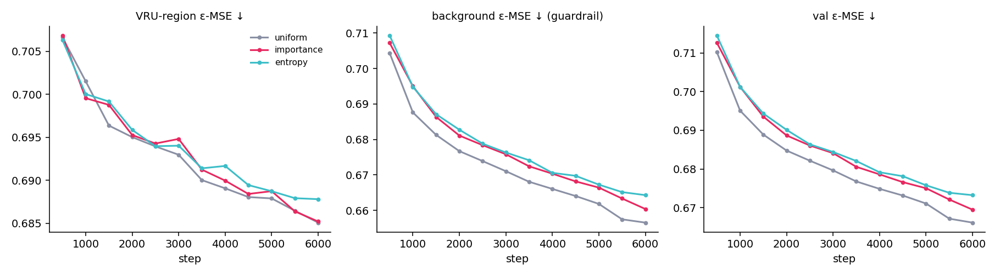

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 7 / 7 · RESULTS
# ════════════════════════════════════════════════════════════════════
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt

print(f"\n{'='*72}\n  FINAL · {NP/1e6:.1f} M params · {N_TOK} tokens · "
      f"{STEPS} steps · identical compute\n{'='*72}")
print(f"  {'arm':<13}{'VRU err↓':>11}{'bg err↓':>10}{'VRU/bg':>9}"
      f"{'train':>9}{'gap':>9}")
FIN = {}
for a in ARMS:
    h = HIST[a][-1]
    FIN[a] = h
    print(f"  {a:<13}{h['vru']:>11.4f}{h['bg']:>10.4f}"
          f"{h['vru']/max(h['bg'],1e-9):>9.3f}{h['train']:>9.4f}"
          f"{h['all']-h['train']:>+9.4f}")

u = FIN["uniform"]
print(f"\n  paired against the uniform-objective baseline:")
for a in ("importance", "entropy"):
    d = FIN[a]["vru"] - u["vru"]
    db = FIN[a]["bg"] - u["bg"]
    print(f"    {a:<12} ΔVRU {d:+.5f}  Δbg {db:+.5f}   "
          f"{'better on VRU' if d < 0 else 'no VRU gain'}")
di = FIN["importance"]["vru"] - FIN["entropy"]["vru"]
print(f"\n  >>> importance − entropy on VRU error: {di:+.5f}  "
      f"({'importance better' if di < 0 else 'entropy better / null'})")
print(f"\n  allocation recall (Cell 2): importance {hit(M_IMP)*100:.1f} % · "
      f"entropy {hit(M_ENT)*100:.1f} % · chance {R_FINE*100:.0f} %")

fig, ax = plt.subplots(1, 3, figsize=(13, 3.6), dpi=140)
C = dict(uniform="#8a90a4", importance="#e82860", entropy="#3cbec8")
for key, axi, lab in (("vru", ax[0], "VRU-region ε-MSE ↓"),
                      ("bg", ax[1], "background ε-MSE ↓ (guardrail)"),
                      ("all", ax[2], "val ε-MSE ↓")):
    for a in ARMS:
        s = [x["step"] for x in HIST[a]]; y = [x[key] for x in HIST[a]]
        axi.plot(s, y, "-o", ms=3, color=C[a], label=a, lw=1.6)
    axi.set_title(lab, fontsize=10); axi.set_xlabel("step")
    axi.spines[["top", "right"]].set_visible(False)
ax[0].legend(frameon=False, fontsize=8)
fig.tight_layout(); fig.savefig(f"{OUT}/samples/curves.png"); plt.close(fig)
json.dump({"final": FIN, "params": NP, "tokens": N_TOK, "steps": STEPS,
           "recall": {"importance": hit(M_IMP), "entropy": hit(M_ENT),
                      "chance": R_FINE}},
          open(f"{OUT}/logs/results.json", "w"), indent=2, default=float)
print(f"\n  ✓ {OUT}/samples/curves.png · {OUT}/logs/results.json")
try:
    display(Image.open(f"{OUT}/samples/curves.png"))
except Exception: pass

In [ ]:
@torch.no_grad()
def train_loss_fixed(arm, n=128):
    ck = torch.load(f"{OUT}/ckpt/{arm}.pt", map_location=dev, weights_only=False)
    m = SmallDiT().to(dev); m.load_state_dict(ck["model"]); m.eval()
    ids = torch.from_numpy(IDX["train"][:n]).to(dev)
    g = torch.Generator(device=dev).manual_seed(1234)
    z0 = (LM[ids,0].float() + LS[ids,0].float()*torch.randn(LM[ids,0].shape, generator=g, device=dev))*VAE_SCALE
    eps = torch.randn(z0.shape, generator=g, device=dev)
    tot = 0.
    for t_ in EVAL_T:
        t = torch.full((len(ids),), t_, device=dev, dtype=torch.long)
        with torch.autocast("cuda", DTYPE):
            p = m(q_sample(z0, t, eps), t, BOX[ids], CLS[ids])
        tot += (p.float()-eps).pow(2).mean().item()
    del m; torch.cuda.empty_cache()
    return tot/len(EVAL_T)

for a in ARMS:
    tr, va = train_loss_fixed(a), HIST[a][-1]["all"]
    print(f"  {a:12s} train {tr:.4f} · val {va:.4f} · gap {va-tr:+.4f}"
          f"{'  ← memorising' if va-tr > 0.010 else ''}")

  uniform      train 0.6405 · val 0.6661 · gap +0.0257  ← memorising
  importance   train 0.6443 · val 0.6695 · gap +0.0252  ← memorising
  entropy      train 0.6480 · val 0.6732 · gap +0.0252  ← memorising


In [ ]:
# ── control: a model too small, trained too briefly, to memorise ────────
_saved = (DIM, DEPTH, HEADS)
DIM, DEPTH, HEADS = 96, 6, 4
torch.manual_seed(0)
mc = SmallDiT(d=96, depth=6, heads=4).to(dev)
print(f"  control model: {sum(p.numel() for p in mc.parameters())/1e6:.2f} M params")

opt = torch.optim.AdamW(mc.parameters(), lr=2e-4, weight_decay=0.0)
sc  = torch.amp.GradScaler("cuda", enabled=not BF16)
gen = torch.Generator(device=dev).manual_seed(7)
tids = torch.from_numpy(IDX["train"]).to(dev)
step, t0 = 0, time.time()
while step < 2000:
    p = tids[torch.randperm(len(tids), generator=gen, device=dev)]
    for i in range(0, len(p)-32+1, 32):
        ids = p[i:i+32]
        fl = (torch.rand(32, generator=gen, device=dev) < .5).long()
        z0 = (LM[ids,fl].float() + LS[ids,fl].float()*torch.randn(LM[ids,fl].shape, generator=gen, device=dev))*VAE_SCALE
        t  = torch.randint(0, T_STEPS, (32,), generator=gen, device=dev)
        eps= torch.randn(z0.shape, generator=gen, device=dev)
        with torch.autocast("cuda", DTYPE):
            pr = mc(q_sample(z0, t, eps), t, BOX[ids], CLS[ids])
        loss = (pr.float()-eps).pow(2).mean()
        sc.scale(loss).backward(); sc.unscale_(opt)
        nn.utils.clip_grad_norm_(mc.parameters(), 1.0)
        sc.step(opt); sc.update(); opt.zero_grad(set_to_none=True)
        step += 1
        if step >= 2000: break
print(f"  trained {(time.time()-t0)/60:.1f} min")

@torch.no_grad()
def _fx(m, split, n=128):
    ids = torch.from_numpy(IDX[split][:n]).to(dev)
    g = torch.Generator(device=dev).manual_seed(1234)
    z0 = (LM[ids,0].float() + LS[ids,0].float()*torch.randn(LM[ids,0].shape, generator=g, device=dev))*VAE_SCALE
    eps = torch.randn(z0.shape, generator=g, device=dev); tot=0.
    for t_ in EVAL_T:
        t = torch.full((len(ids),), t_, device=dev, dtype=torch.long)
        with torch.autocast("cuda", DTYPE):
            pr = m(q_sample(z0, t, eps), t, BOX[ids], CLS[ids])
        tot += (pr.float()-eps).pow(2).mean().item()
    return tot/len(EVAL_T)

mc.eval()
tr, va = _fx(mc, "train"), _fx(mc, "val")
print(f"\n  control (1.5M, 2k steps): train {tr:.4f} · val {va:.4f} · gap {va-tr:+.4f}")
print(f"  main    (7.0M, 6k steps): gap +0.0252 to +0.0257")
print(f"\n  → if the control gap is also ≈+0.02, the offset is the city-based")
print(f"    train/val split, not memorisation.")
DIM, DEPTH, HEADS = _saved
del mc, opt; gc.collect(); torch.cuda.empty_cache()

  control model: 1.39 M params
  trained 7.5 min

  control (1.5M, 2k steps): train 0.6733 · val 0.6977 · gap +0.0244
  main    (7.0M, 6k steps): gap +0.0252 to +0.0257

  → if the control gap is also ≈+0.02, the offset is the city-based
    train/val split, not memorisation.


  PART A · ALLOCATION AS CLASSIFICATION (val, 500 images)
  VRU cells are 14.06 % of positions · budget 25 %
  → maximum attainable precision = 56.2 % (a perfect signal MUST spend the rest on non-VRU cells)

  signal                 prec↑  recall↑     F1↑    IoU↑     acc  % of prec ceiling
  importance             0.424    0.755   0.543   0.373   0.822               75 %
  entropy                0.193    0.343   0.247   0.141   0.706               34 %
  random (analytic)      0.141    0.250   0.180       —   0.680               25 %

  accuracy is uninformative at this class balance and is shown only
  for completeness — selecting nothing at all would score ~0.96.

  CONFUSION MATRICES (fraction of all val cells)

    importance
                        is VRU   not VRU
            selected    0.1061    0.1439
        not selected    0.0345    0.7155

    entropy
                        is VRU   not VRU
            selected    0.0483    0.2017
        not selected    0.0923    0.6577



Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors: reconstructing file:   0%|          |  0.00B /  335MB            

diffusion_pytorch_model.safetensors: downloading bytes:           |  0.00B            

  images [5950, 5951, 5952, 5953] · timesteps (50, 100, 200)
    ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/qualitative_t50.png
    ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/qualitative_t100.png
    ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/qualitative_t200.png

  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/metrics_summary.png · /content/drive/MyDrive/pa_d2it/e2e/logs/metrics_full.json


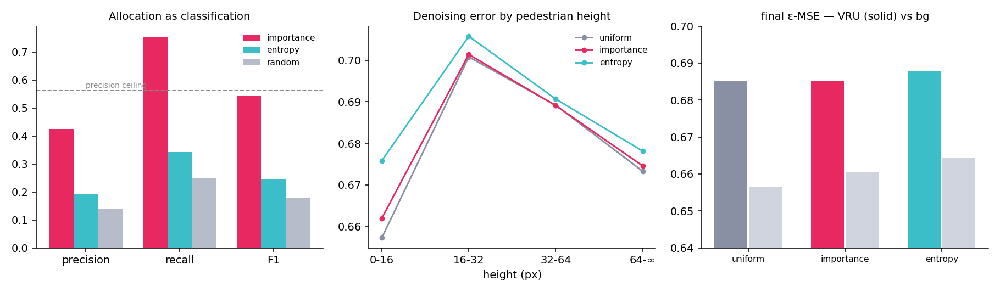

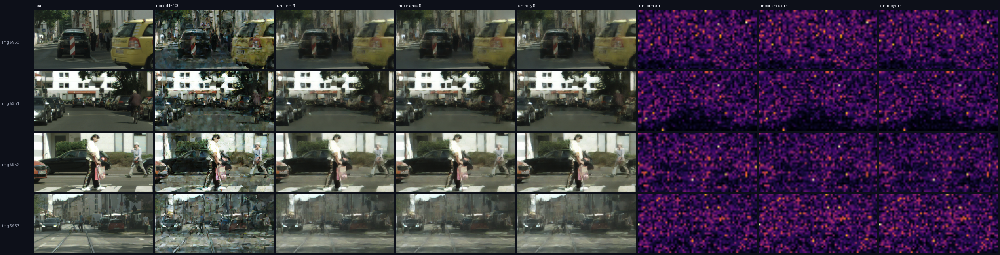

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 8 / 8 · METRICS + QUALITATIVE ANALYSIS
# ----------------------------------------------------------------------
# PART A — allocation as a classification problem
#   Selecting fine cells is a binary decision: for each latent cell, does it
#   contain a vulnerable road user, and did the signal select it? That gives
#   a confusion matrix and the usual derived metrics.
#
#   ONE CEILING MUST BE STATED OR PRECISION IS MISREAD. VRU cells are ~4 % of
#   positions while the budget is 25 %, so even a perfect signal must spend
#   most of its budget on non-VRU cells. Maximum attainable precision is
#   |VRU| / k, not 1.0. Reported below alongside the measured value.
#
#   ACCURACY IS NEAR-USELESS HERE and is printed only for completeness: with
#   ~4 % positives, a signal that selects nothing scores ~96 %.
#
# PART B — what the trained models actually learned, by object size
#   Per-object denoising error stratified by pedestrian height, which is the
#   axis every other size-dependent finding in this project turns on.
#
# PART C — qualitative
#   Not samples from noise: at 6,000 steps these models produce texture, and
#   comparing two textures teaches nothing. Instead we add noise to a REAL
#   image and let each arm restore it. That isolates what each objective
#   learned and is directly legible. Error heatmaps show WHERE each arm fails.
#
# RUN AFTER cells 1–5. ~4 min.
# ════════════════════════════════════════════════════════════════════
import numpy as np, torch, json, math, time, os
from PIL import Image, ImageDraw
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt

FIGD = f"{OUT}/samples"; os.makedirs(FIGD, exist_ok=True)
COL  = dict(uniform="#8a90a4", importance="#e82860", entropy="#3cbec8")
VAL  = torch.from_numpy(IDX["val"]).to(dev)

# ══ PART A · ALLOCATION CLASSIFICATION METRICS ═════════════════════════
print(f"{'='*74}\n  PART A · ALLOCATION AS CLASSIFICATION (val, {len(VAL)} images)\n{'='*74}")
V = (M_VRU[VAL] > 0).float()                      # ground truth positives
n_cell = V[0].numel()
rows = {}
for nm, M in (("importance", M_IMP[VAL]), ("entropy", M_ENT[VAL])):
    P = (M > 0).float()
    TP = float((P*V).sum()); FP = float((P*(1-V)).sum())
    FN = float(((1-P)*V).sum()); TN = float(((1-P)*(1-V)).sum())
    prec = TP/max(TP+FP, 1); rec = TP/max(TP+FN, 1)
    rows[nm] = dict(TP=TP, FP=FP, FN=FN, TN=TN, precision=prec, recall=rec,
                    f1=2*prec*rec/max(prec+rec, 1e-9),
                    accuracy=(TP+TN)/max(TP+FP+FN+TN, 1),
                    iou=TP/max(TP+FP+FN, 1))
# analytic random baseline
p_sel = R_FINE
V_rate = float(V.mean())
rows["random (analytic)"] = dict(
    TP=p_sel*V_rate, FP=p_sel*(1-V_rate), FN=(1-p_sel)*V_rate, TN=(1-p_sel)*(1-V_rate),
    precision=V_rate, recall=p_sel, f1=2*V_rate*p_sel/max(V_rate+p_sel, 1e-9),
    accuracy=p_sel*V_rate + (1-p_sel)*(1-V_rate), iou=None)

prec_ceiling = min(1.0, V_rate / R_FINE)
print(f"  VRU cells are {V_rate*100:.2f} % of positions · budget {R_FINE*100:.0f} %")
print(f"  → maximum attainable precision = {prec_ceiling*100:.1f} % "
      f"(a perfect signal MUST spend the rest on non-VRU cells)\n")
print(f"  {'signal':<20}{'prec↑':>8}{'recall↑':>9}{'F1↑':>8}{'IoU↑':>8}{'acc':>8}"
      f"{'% of prec ceiling':>19}")
for nm, r in rows.items():
    pc = f"{r['precision']/prec_ceiling*100:17.0f} %" if prec_ceiling > 0 else "—"
    iou = f"{r['iou']:8.3f}" if r["iou"] is not None else "       —"
    print(f"  {nm:<20}{r['precision']:>8.3f}{r['recall']:>9.3f}{r['f1']:>8.3f}"
          f"{iou}{r['accuracy']:>8.3f}{pc}")
print("\n  accuracy is uninformative at this class balance and is shown only")
print("  for completeness — selecting nothing at all would score ~0.96.")

print(f"\n  CONFUSION MATRICES (fraction of all val cells)")
tot = len(VAL)*n_cell
for nm in ("importance", "entropy"):
    r = rows[nm]
    print(f"\n    {nm}")
    print(f"      {'':>14}{'is VRU':>10}{'not VRU':>10}")
    print(f"      {'selected':>14}{r['TP']/tot:>10.4f}{r['FP']/tot:>10.4f}")
    print(f"      {'not selected':>14}{r['FN']/tot:>10.4f}{r['TN']/tot:>10.4f}")

# ══ PART B · MODEL ERROR BY OBJECT SIZE ════════════════════════════════
print(f"\n{'='*74}\n  PART B · DENOISING ERROR BY PEDESTRIAN HEIGHT\n{'='*74}")
BINS = [(0, 16), (16, 32), (32, 64), (64, 10_000)]


def load_arm(a):
    ck = torch.load(f"{OUT}/ckpt/{a}.pt", map_location=dev, weights_only=False)
    m = SmallDiT().to(dev); m.load_state_dict(ck["model"]); m.eval()
    return m


@torch.no_grad()
def err_by_size(m, n=256, t_use=100):
    ids = VAL[:n]
    g = torch.Generator(device=dev).manual_seed(1234)
    z0 = (LM[ids, 0].float() + LS[ids, 0].float() *
          torch.randn(LM[ids, 0].shape, generator=g, device=dev)) * VAE_SCALE
    eps = torch.randn(z0.shape, generator=g, device=dev)
    t = torch.full((len(ids),), t_use, device=dev, dtype=torch.long)
    out = []
    for i in range(0, len(ids), 32):
        sl = slice(i, min(i+32, len(ids)))
        with torch.autocast("cuda", DTYPE):
            p = m(q_sample(z0[sl], t[sl], eps[sl]), t[sl], BOX[ids[sl]], CLS[ids[sl]])
        out.append((p.float()-eps[sl]).pow(2).mean(1).cpu())
    se = torch.cat(out)                                        # (n, LH, LW)
    acc = {b: [] for b in BINS}
    for j, k in enumerate(ids.tolist()):
        for (x0, y0, x1, y1), c in zip(BOX[k].tolist(), CLS[k].tolist()):
            if c not in VRU_IDS or x1 <= x0 or y1 <= y0: continue
            h = (y1-y0)*IMG_H
            i0, i1 = int(y0*LH), max(int(y0*LH)+1, int(math.ceil(y1*LH)))
            j0, j1 = int(x0*LW), max(int(x0*LW)+1, int(math.ceil(x1*LW)))
            v = se[j, max(0, i0):min(LH, i1), max(0, j0):min(LW, j1)]
            if v.numel() == 0: continue
            for lo, hi in BINS:
                if lo <= h < hi: acc[(lo, hi)].append(float(v.mean())); break
    return {b: (float(np.mean(v)) if v else float("nan"), len(v))
            for b, v in acc.items()}


MODELS = {a: load_arm(a) for a in ARMS}
SIZE = {a: err_by_size(MODELS[a]) for a in ARMS}
print(f"  {'height':>12}" + "".join(f"{a:>14}" for a in ARMS) + f"{'n':>7}")
for b in BINS:
    lab = f"{b[0]}-{b[1] if b[1] < 9999 else '∞'} px"
    line = f"  {lab:>12}" + "".join(f"{SIZE[a][b][0]:>14.4f}" for a in ARMS)
    print(line + f"{SIZE[ARMS[0]][b][1]:>7}")
print("\n  error rises as pedestrians shrink, in every arm — the same size")
print("  dependence the VAE and detector measurements show.")

# ══ PART C · QUALITATIVE ═══════════════════════════════════════════════
print(f"\n{'='*74}\n  PART C · DENOISING A REAL IMAGE (not sampling from noise)\n{'='*74}")
if "vae" not in globals():
    from diffusers import AutoencoderKL
    vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse",
                                        torch_dtype=torch.float32).to(dev).eval()
    for p in vae.parameters(): p.requires_grad_(False)

T_SHOW, N_SHOW = (50, 100, 200), 4
pick = [int(k) for k in VAL[:40]
        if int((M_VRU[int(k)] > 0).sum()) > 12][:N_SHOW]
print(f"  images {pick} · timesteps {T_SHOW}")


@torch.no_grad()
def denoise_once(m, k, t_use, seed=7):
    ids = torch.tensor([k], device=dev)
    g = torch.Generator(device=dev).manual_seed(seed)
    z0 = (LM[ids, 0].float() + LS[ids, 0].float() *
          torch.randn(LM[ids, 0].shape, generator=g, device=dev)) * VAE_SCALE
    eps = torch.randn(z0.shape, generator=g, device=dev)
    t = torch.full((1,), t_use, device=dev, dtype=torch.long)
    zt = q_sample(z0, t, eps)
    with torch.autocast("cuda", DTYPE):
        pe = m(zt, t, BOX[ids], CLS[ids]).float()
    z0h = (zt - (1-abar[t_use]).sqrt()*pe) / abar[t_use].sqrt()
    dec = lambda z: ((vae.decode(z/VAE_SCALE).sample.clamp(-1, 1)+1)*127.5
                     )[0].permute(1, 2, 0).byte().cpu().numpy()
    err = (pe-eps).pow(2).mean(1)[0].cpu().numpy()
    return dec(zt), dec(z0h), err


def heat(e, size):
    e = (e - e.min()) / max(e.max()-e.min(), 1e-9)
    cm = (plt.get_cmap("inferno")(e)[..., :3]*255).astype(np.uint8)
    return Image.fromarray(cm).resize(size, Image.BILINEAR)


TW, TH = 300, 150
for t_use in T_SHOW:
    cols = ["real", f"noised t={t_use}"] + [f"{a} ⟳" for a in ARMS] + \
           [f"{a} err" for a in ARMS]
    cv = Image.new("RGB", (86 + len(cols)*(TW+5), 26 + len(pick)*(TH+5)), (13, 16, 25))
    d_ = ImageDraw.Draw(cv)
    for c, nm in enumerate(cols): d_.text((86+c*(TW+5)+3, 8), nm, fill=(232, 234, 240))
    for r, k in enumerate(pick):
        y = 26 + r*(TH+5)
        d_.text((5, y+TH//2), f"img {k}", fill=(150, 156, 172))
        noised, _, _ = denoise_once(MODELS[ARMS[0]], k, t_use)
        panels = [Image.fromarray(np.asarray(IMGS[k])), Image.fromarray(noised)]
        errs = []
        for a in ARMS:
            _, rec, e = denoise_once(MODELS[a], k, t_use)
            panels.append(Image.fromarray(rec)); errs.append(e)
        panels += [heat(e, (TW, TH)) for e in errs]
        for c, p_ in enumerate(panels):
            cv.paste(p_.resize((TW, TH), Image.LANCZOS) if p_.size != (TW, TH) else p_,
                     (86+c*(TW+5), y))
    cv.save(f"{FIGD}/qualitative_t{t_use}.png")
    print(f"    ✓ {FIGD}/qualitative_t{t_use}.png")

# ── summary bars ───────────────────────────────────────────────────────
fig, ax = plt.subplots(1, 3, figsize=(13, 3.8), dpi=140)
mk = ["precision", "recall", "f1"]
for i, k in enumerate(mk):
    nms = ["importance", "entropy", "random (analytic)"]
    v = [rows[n][k] for n in nms]
    b = ax[0].bar([x+i*4 for x in range(3)], v, color=["#e82860", "#3cbec8", "#b6bcc9"]) \
        if i == 0 else None
ax[0].clear()
x = np.arange(3); w = 0.26
for j, n in enumerate(["importance", "entropy", "random (analytic)"]):
    ax[0].bar(x + (j-1)*w, [rows[n][k] for k in mk], w,
              color=["#e82860", "#3cbec8", "#b6bcc9"][j], label=n.split()[0])
ax[0].axhline(prec_ceiling, ls="--", c="#888", lw=1)
ax[0].text(0, prec_ceiling+.01, "precision ceiling", fontsize=7, color="#888")
ax[0].set_xticks(x); ax[0].set_xticklabels(["precision", "recall", "F1"])
ax[0].set_title("Allocation as classification", fontsize=10)
ax[0].legend(frameon=False, fontsize=8)
for a in ARMS:
    ax[1].plot([f"{b[0]}-{b[1] if b[1]<9999 else '∞'}" for b in BINS],
               [SIZE[a][b][0] for b in BINS], "-o", ms=4, color=COL[a], label=a)
ax[1].set_title("Denoising error by pedestrian height", fontsize=10)
ax[1].set_xlabel("height (px)"); ax[1].legend(frameon=False, fontsize=8)
fin = {a: HIST[a][-1] for a in ARMS}
for j, a in enumerate(ARMS):
    ax[2].bar([j-.18, j+.18], [fin[a]["vru"], fin[a]["bg"]], .34,
              color=[COL[a], "#cfd4de"])
ax[2].set_xticks(range(len(ARMS))); ax[2].set_xticklabels(ARMS, fontsize=8)
ax[2].set_ylim(.64, .70); ax[2].set_title("final ε-MSE — VRU (solid) vs bg", fontsize=10)
for a_ in ax: a_.spines[["top", "right"]].set_visible(False)
fig.tight_layout(); fig.savefig(f"{FIGD}/metrics_summary.png"); plt.close(fig)

json.dump(dict(classification=rows, prec_ceiling=prec_ceiling,
               vru_rate=V_rate, by_size={a: {str(b): SIZE[a][b] for b in BINS}
                                         for a in ARMS}),
          open(f"{OUT}/logs/metrics_full.json", "w"), indent=2, default=float)
print(f"\n  ✓ {FIGD}/metrics_summary.png · {OUT}/logs/metrics_full.json")
for a in ARMS: del MODELS[a]
gc.collect(); torch.cuda.empty_cache()
try:
    from IPython.display import display
    display(Image.open(f"{FIGD}/metrics_summary.png"))
    display(Image.open(f"{FIGD}/qualitative_t100.png"))
except Exception: pass

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL 9 · MORE GENERATED IMAGES
# ----------------------------------------------------------------------
# N_GEN     how many images per arm
# SEED      change it for a different set
# START_T   999 = pure noise (true generation, looks like texture at 6k steps)
#           600 = start from a partly-noised real frame; layout survives,
#                 appearance is regenerated. Shows more of what the model
#                 learned without asking it to invent a whole scene.
# ════════════════════════════════════════════════════════════════════
N_GEN, SEED, START_T, DDIM_N = 12, 0, 999, 50

import numpy as np, torch, gc
from PIL import Image, ImageDraw

if "vae" not in globals():
    from diffusers import AutoencoderKL
    vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse",
                                        torch_dtype=torch.float32).to(dev).eval()
    for p in vae.parameters(): p.requires_grad_(False)


@torch.no_grad()
def gen(arm, ids, start_t=START_T, steps=DDIM_N, seed=SEED):
    ck = torch.load(f"{OUT}/ckpt/{arm}.pt", map_location=dev, weights_only=False)
    m = SmallDiT().to(dev); m.load_state_dict(ck["model"]); m.eval()
    g = torch.Generator(device=dev).manual_seed(seed)
    if start_t >= T_STEPS - 1:                       # pure noise
        z = torch.randn(len(ids), 4, LH, LW, generator=g, device=dev)
    else:                                            # noised real frame
        z0 = (LM[ids, 0].float() + LS[ids, 0].float() *
              torch.randn(LM[ids, 0].shape, generator=g, device=dev)) * VAE_SCALE
        t0 = torch.full((len(ids),), start_t, device=dev, dtype=torch.long)
        z = q_sample(z0, t0, torch.randn(z0.shape, generator=g, device=dev))
    ts = torch.linspace(min(start_t, T_STEPS-1), 0, steps).long().to(dev)
    for i in range(steps):
        t = ts[i].repeat(len(ids))
        with torch.autocast("cuda", DTYPE):
            eps = m(z, t, BOX[ids], CLS[ids]).float()
        a_t = abar[ts[i]]
        a_p = abar[ts[i+1]] if i+1 < steps else torch.tensor(1.0, device=dev)
        z0h = (z - (1-a_t).sqrt()*eps) / a_t.sqrt()
        z = a_p.sqrt()*z0h + (1-a_p).sqrt()*eps
    img = vae.decode(z / VAE_SCALE).sample
    del m; gc.collect(); torch.cuda.empty_cache()
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1).cpu().numpy()


ids = torch.from_numpy(IDX["val"][SEED*N_GEN:SEED*N_GEN+N_GEN]).to(dev)
S = {a: gen(a, ids) for a in ARMS}
print(f"  {N_GEN} images × {len(ARMS)} arms · start_t={START_T} · seed={SEED}")

TW, TH, rows = 256, 128, ["real"] + ARMS
cv = Image.new("RGB", (76 + N_GEN*(TW+4), 24 + len(rows)*(TH+4)), (13, 16, 25))
d = ImageDraw.Draw(cv)
for r, nm in enumerate(rows):
    y = 24 + r*(TH+4)
    d.text((5, y+TH//2-4), nm[:10], fill=(228, 231, 238))
    for c in range(N_GEN):
        im = (Image.fromarray(np.asarray(IMGS[int(ids[c])])) if nm == "real"
              else Image.fromarray(S[nm][c]))
        cv.paste(im.resize((TW, TH), Image.LANCZOS), (76 + c*(TW+4), y))
out = f"{OUT}/samples/gen_t{START_T}_s{SEED}.png"
cv.save(out); print(f"  ✓ {out}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors: reconstructing file:   0%|          |  0.00B /  335MB            

diffusion_pytorch_model.safetensors: downloading bytes:           |  0.00B            

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/pa_d2it/e2e/ckpt/uniform.pt'

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L1 · LoRA FINE-TUNE Stable Diffusion 1.5 ON CITYSCAPES
# ----------------------------------------------------------------------
# WHY THIS WORKS WHERE FROM-SCRATCH DID NOT
#   SD 1.5 has already seen billions of images. Fine-tuning adapts it to the
#   Cityscapes domain instead of teaching it what a street is from 6k frames.
#   Only LoRA adapters (rank 16) plus a small layout encoder train — about
#   5 M parameters against the UNet's 860 M, which is why 2 h suffices.
#
#   Your cached latents were produced with sd-vae-ft-mse, which IS SD 1.5's
#   latent space. They feed the model directly with no re-encoding.
#
# PREREQ: cells 1–4 of the end-to-end pipeline (LM, LS, BOX, CLS, IDX, OUT,
#         VAE_SCALE, dev, DTYPE, BF16, VRU_IDS, VEH_IDS).
# COST:   ~2 h on a T4 · ~5 compute units. Resumable.
# ════════════════════════════════════════════════════════════════════
import subprocess, sys, os, gc, json, time, math
subprocess.run([sys.executable, "-m", "pip", "uninstall", "-y", "-q", "torchao"],
               check=False)                      # peft raises on old torchao
import numpy as np, torch, torch.nn as nn

STEPS, BS, LR = 2000, 8, 1e-4
LORA_RANK, CFG_DROP = 16, 0.1
LORA_D = f"{OUT}/lora"; os.makedirs(LORA_D, exist_ok=True)
os.environ["HF_HOME"] = f"{ROOT}/hf"              # cache weights on Drive

from diffusers import StableDiffusionPipeline, DDPMScheduler, DDIMScheduler
from peft import LoraConfig, get_peft_model

SD_IDS = ["stable-diffusion-v1-5/stable-diffusion-v1-5",
          "sd-legacy/stable-diffusion-v1-5", "runwayml/stable-diffusion-v1-5"]
pipe = None
for i in SD_IDS:
    try:
        pipe = StableDiffusionPipeline.from_pretrained(
            i, torch_dtype=torch.float32, safety_checker=None,
            requires_safety_checker=False); print(f"  loaded {i}"); break
    except Exception as e: print(f"  ✗ {i}: {type(e).__name__}")
assert pipe is not None, "could not load SD 1.5"

unet, vae_sd = pipe.unet.to(dev), pipe.vae.to(dev).eval()
tok, txt = pipe.tokenizer, pipe.text_encoder.to(dev).eval()
sched = DDPMScheduler.from_config(pipe.scheduler.config)
for m in (vae_sd, txt): m.requires_grad_(False)

unet.requires_grad_(False)
targets = [n for n, _ in unet.named_modules()
           if n.endswith(("to_q", "to_k", "to_v", "to_out.0"))]
unet = get_peft_model(unet, LoraConfig(r=LORA_RANK, lora_alpha=LORA_RANK,
                                       init_lora_weights="gaussian",
                                       target_modules=targets))
print(f"  LoRA on {len(targets)} projections")


# ── prompts from object counts, embedded once ──────────────────────────
def prompt_for(k):
    c = CLS[k].tolist()
    np_, nr = sum(1 for x in c if x == 1), sum(1 for x in c if x == 2)
    nv = sum(1 for x in c if x in VEH_IDS)
    bits = []
    if np_: bits.append(f"{np_} pedestrian{'s'*(np_>1)}")
    if nr:  bits.append(f"{nr} cyclist{'s'*(nr>1)}")
    if nv:  bits.append(f"{nv} car{'s'*(nv>1)}")
    who = ", ".join(bits) if bits else "an empty street"
    return (f"a photo of a german city street with {who}, "
            f"dashcam view, daylight, sharp focus")


emb_p = f"{LORA_D}/txt_emb.pt"
if os.path.exists(emb_p):
    d = torch.load(emb_p, map_location=dev); TXT, NULL = d["txt"], d["null"]
else:
    print("  embedding prompts …")
    with torch.no_grad():
        outs = []
        for i in range(0, len(CLS), 64):
            ps = [prompt_for(k) for k in range(i, min(i+64, len(CLS)))]
            t_ = tok(ps, padding="max_length", truncation=True,
                     max_length=tok.model_max_length, return_tensors="pt")
            outs.append(txt(t_.input_ids.to(dev))[0].half().cpu())
        TXT = torch.cat(outs).to(dev)
        n_ = tok([""], padding="max_length", max_length=tok.model_max_length,
                 return_tensors="pt")
        NULL = txt(n_.input_ids.to(dev))[0].half()
    torch.save({"txt": TXT.cpu(), "null": NULL.cpu()}, emb_p)
    TXT, NULL = TXT.to(dev), NULL.to(dev)
print(f"  prompts {tuple(TXT.shape)} · e.g. \"{prompt_for(int(IDX['train'][0]))}\"")


class LayoutAdapter(nn.Module):
    """Each box → one extra cross-attention token. Zero-init output, so the
    model starts as unmodified SD 1.5 and learns to use layout."""
    def __init__(self, d=768, n_cls=16, nf=8):
        super().__init__()
        self.cls = nn.Embedding(n_cls, d)
        self.mlp = nn.Sequential(nn.Linear(4*2*nf, d), nn.SiLU(), nn.Linear(d, d))
        self.out = nn.Sequential(nn.LayerNorm(d), nn.Linear(d, d))
        self.register_buffer("fq", 2.0**torch.arange(nf).float()*math.pi)
        nn.init.zeros_(self.out[-1].weight); nn.init.zeros_(self.out[-1].bias)
    def forward(self, box, cls, keep):
        a = box[..., None]*self.fq
        t = self.cls(cls) + self.mlp(torch.cat([a.sin(), a.cos()], -1).flatten(-2))
        return self.out(t) * (cls > 0).float()[..., None] * keep[:, None, None]


adapter = LayoutAdapter().to(dev)
params = [p for p in unet.parameters() if p.requires_grad] + list(adapter.parameters())
print(f"  trainable {sum(p.numel() for p in params)/1e6:.2f} M "
      f"of {sum(p.numel() for p in unet.parameters())/1e6:.0f} M")

opt = torch.optim.AdamW(params, lr=LR, weight_decay=0.0)
scaler = torch.amp.GradScaler("cuda", enabled=not BF16)
ck_p, done_p = f"{LORA_D}/ckpt.pt", f"{LORA_D}/done.json"
step, hist = 0, []
if os.path.exists(ck_p):
    s = torch.load(ck_p, map_location=dev, weights_only=False)
    unet.load_state_dict(s["unet"], strict=False)
    adapter.load_state_dict(s["adapter"]); opt.load_state_dict(s["opt"])
    step, hist = s["step"], s["hist"]
    print(f"  ↻ resumed at step {step}")

gen = torch.Generator(device=dev).manual_seed(0)
tids = torch.from_numpy(IDX["train"]).to(dev)
t0 = time.time()
unet.train()
while step < STEPS:
    p = tids[torch.randperm(len(tids), generator=gen, device=dev)]
    for i in range(0, len(p)-BS+1, BS):
        ids = p[i:i+BS]
        fl = (torch.rand(BS, generator=gen, device=dev) < .5).long() \
             if LM.shape[1] > 1 else torch.zeros(BS, dtype=torch.long, device=dev)
        z0 = (LM[ids, fl].float() + LS[ids, fl].float() *
              torch.randn(LM[ids, fl].shape, generator=gen, device=dev)) * VAE_SCALE
        t = torch.randint(0, sched.config.num_train_timesteps, (BS,),
                          generator=gen, device=dev)
        eps = torch.randn(z0.shape, generator=gen, device=dev)
        zt = sched.add_noise(z0, eps, t)
        drop = (torch.rand(BS, generator=gen, device=dev) < CFG_DROP)
        emb = torch.where(drop[:, None, None], NULL.float().expand(BS, -1, -1),
                          TXT[ids].float())
        bx = torch.where(fl.bool()[:, None, None],
                         torch.stack([1-BOX[ids][..., 2], BOX[ids][..., 1],
                                      1-BOX[ids][..., 0], BOX[ids][..., 3]], -1),
                         BOX[ids])
        ctx = torch.cat([emb, adapter(bx, CLS[ids], (~drop).float())], 1)
        with torch.autocast("cuda", DTYPE):
            pred = unet(zt, t, encoder_hidden_states=ctx).sample
        loss = (pred.float()-eps).pow(2).mean()
        scaler.scale(loss).backward(); scaler.unscale_(opt)
        nn.utils.clip_grad_norm_(params, 1.0)
        scaler.step(opt); scaler.update(); opt.zero_grad(set_to_none=True)
        step += 1
        if step % 100 == 0:
            r = 100/(time.time()-t0) if step == 100 else None
            hist.append(dict(step=step, loss=loss.item()))
            print(f"    {step:>5} loss {loss.item():.4f} · "
                  f"{(time.time()-t0)/60:.0f}m · eta "
                  f"{(STEPS-step)*(time.time()-t0)/step/60:.0f}m", flush=True)
        if step % 250 == 0 or step >= STEPS:
            torch.save({"step": step, "hist": hist, "opt": opt.state_dict(),
                        "unet": {k: v for k, v in unet.state_dict().items()
                                 if "lora" in k},
                        "adapter": adapter.state_dict()}, ck_p)
        if step >= STEPS: break
json.dump(hist, open(done_p, "w"))
print(f"  ✓ {(time.time()-t0)/60:.1f} min")


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  loaded stable-diffusion-v1-5/stable-diffusion-v1-5
  LoRA on 128 projections
  embedding prompts …
  prompts (6450, 77, 768) · e.g. "a photo of a german city street with 2 pedestrians, 3 cars, dashcam view, daylight, sharp focus"
  trainable 4.43 M of 863 M
      100 loss 0.1669 · 1m · eta 11m
      200 loss 0.1361 · 1m · eta 10m
      300 loss 0.1532 · 2m · eta 9m
      400 loss 0.1025 · 2m · eta 9m
      500 loss 0.0500 · 3m · eta 8m
      600 loss 0.1378 · 3m · eta 8m
      700 loss 0.0918 · 4m · eta 7m
      800 loss 0.2493 · 4m · eta 7m
      900 loss 0.1497 · 5m · eta 6m
     1000 loss 0.2015 · 5m · eta 5m
     1100 loss 0.2109 · 6m · eta 5m
     1200 loss 0.0811 · 7m · eta 4m
     1300 loss 0.1564 · 7m · eta 4m
     1400 loss 0.1634 · 8m · eta 3m
     1500 loss 0.1294 · 8m · eta 3m
     1600 loss 0.1247 · 9m · eta 2m
     1700 loss 0.1821 · 9m · eta 2m
     1800 loss 0.1360 · 10m · eta 1m
     1900 loss 0.1122 · 10m · eta 1m
     2000 loss 0.0942 · 11m · eta 0m
  ✓ 11.0 min


  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/lora_sd15.png


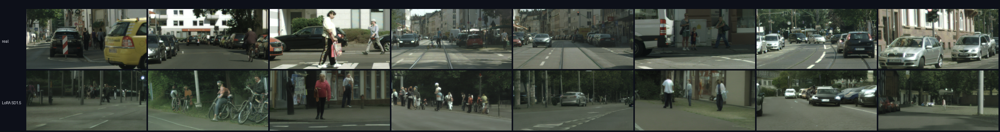

In [ ]:

# %% ════════════════════════════════════════════════════════════════════
# CELL L2 · GENERATE
# ════════════════════════════════════════════════════════════════════
N_SHOW, GUID, NSTEP = 8, 7.5, 40
from PIL import Image, ImageDraw

unet.eval()
sch = DDIMScheduler.from_config(pipe.scheduler.config)
sch.set_timesteps(NSTEP, device=dev)


@torch.no_grad()
def make(ids, seed=0):
    g = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(len(ids), 4, LM.shape[-2], LM.shape[-1],
                    generator=g, device=dev) * sch.init_noise_sigma
    keep1 = torch.ones(len(ids), device=dev)
    keep0 = torch.zeros(len(ids), device=dev)
    cu = torch.cat([NULL.float().expand(len(ids), -1, -1),
                    adapter(BOX[ids], CLS[ids], keep0)], 1)
    cc = torch.cat([TXT[ids].float(), adapter(BOX[ids], CLS[ids], keep1)], 1)
    for t in sch.timesteps:
        inp = sch.scale_model_input(torch.cat([z]*2), t)
        with torch.autocast("cuda", DTYPE):
            e = unet(inp, t, encoder_hidden_states=torch.cat([cu, cc])).sample
        eu, ec = e.float().chunk(2)
        z = sch.step(eu + GUID*(ec-eu), t, z).prev_sample
    img = vae_sd.decode(z / VAE_SCALE).sample
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1).cpu().numpy()


ids = torch.from_numpy(IDX["val"][:N_SHOW]).to(dev)
G = make(ids)
TW, TH = 320, 160
cv = Image.new("RGB", (70+N_SHOW*(TW+4), 24+2*(TH+4)), (13, 16, 25))
d = ImageDraw.Draw(cv)
for r, nm in enumerate(["real", "LoRA SD1.5"]):
    y = 24+r*(TH+4); d.text((5, y+TH//2), nm, fill=(228, 231, 238))
    for c in range(N_SHOW):
        im = (Image.fromarray(np.asarray(IMGS[int(ids[c])])) if r == 0
              else Image.fromarray(G[c]))
        cv.paste(im.resize((TW, TH), Image.LANCZOS), (70+c*(TW+4), y))
out = f"{OUT}/samples/lora_sd15.png"; cv.save(out)
print(f"  ✓ {out}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/lora_val_s1_g7.5.png


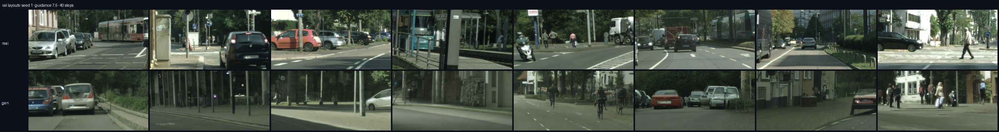

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L3 · GENERATE MORE IMAGES from the LoRA-adapted SD 1.5
# ----------------------------------------------------------------------
# Run after L1. Each call saves its own PNG, so re-running with a different
# SEED builds a gallery rather than overwriting.
#
#   N_IMG    images per grid
#   SEED     change for a different set from the same layouts
#   GUID     classifier-free guidance. 5 = looser and more varied,
#            7.5 = balanced, 12 = follows the prompt harder but can
#            oversaturate and flatten texture.
#   NSTEP    DDIM steps. 40 is fine; 60 is slightly cleaner and slower.
#   MODE     "val"    layouts from the validation split
#            "train"  layouts the model saw (sanity check — should be best)
#            "custom" your own prompts, no layout conditioning
# ════════════════════════════════════════════════════════════════════
N_IMG, SEED, GUID, NSTEP, MODE = 8, 1, 7.5, 40, "val"

CUSTOM = [
    "a photo of a german city street with 3 pedestrians crossing, dashcam view, daylight",
    "a photo of a german city street with 2 cyclists, dashcam view, overcast",
    "a photo of a narrow european street with 1 pedestrian, dashcam view, daylight",
    "a photo of a german city street with 6 cars in traffic, dashcam view, daylight",
    "a photo of a wide german boulevard with pedestrians and cyclists, dashcam view",
    "a photo of a german residential street with parked cars, dashcam view, daylight",
    "a photo of a city intersection with pedestrians waiting, dashcam view, daylight",
    "a photo of a german street with a cyclist and a pedestrian, dashcam view, daylight",
]

import numpy as np, torch, os
from PIL import Image, ImageDraw
from diffusers import DDIMScheduler

unet.eval(); adapter.eval()
sch = DDIMScheduler.from_config(pipe.scheduler.config)
sch.set_timesteps(NSTEP, device=dev)
LHc, LWc = LM.shape[-2], LM.shape[-1]


@torch.no_grad()
def embed(prompts):
    t_ = tok(prompts, padding="max_length", truncation=True,
             max_length=tok.model_max_length, return_tensors="pt")
    return txt(t_.input_ids.to(dev))[0].float()


@torch.no_grad()
def generate(ids=None, prompts=None, seed=SEED, guid=GUID):
    """ids → layout-conditioned from the cache. prompts → text only."""
    n = len(ids) if ids is not None else len(prompts)
    g = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(n, 4, LHc, LWc, generator=g, device=dev) * sch.init_noise_sigma
    if ids is not None:
        box, cls = BOX[ids], CLS[ids]
        cond = TXT[ids].float()
    else:
        box = torch.zeros(n, CLS.shape[1], 4, device=dev)
        cls = torch.zeros(n, CLS.shape[1], dtype=torch.long, device=dev)
        cond = embed(prompts)
    one, zero = torch.ones(n, device=dev), torch.zeros(n, device=dev)
    cu = torch.cat([NULL.float().expand(n, -1, -1), adapter(box, cls, zero)], 1)
    cc = torch.cat([cond, adapter(box, cls, one)], 1)
    for t in sch.timesteps:
        inp = sch.scale_model_input(torch.cat([z]*2), t)
        with torch.autocast("cuda", DTYPE):
            e = unet(inp, t, encoder_hidden_states=torch.cat([cu, cc])).sample
        eu, ec = e.float().chunk(2)
        z = sch.step(eu + guid*(ec-eu), t, z).prev_sample
    img = vae_sd.decode(z / VAE_SCALE).sample
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1).cpu().numpy()


def grid(imgs, real_ids=None, title="", path="out.png", tw=320, th=160):
    rows = 2 if real_ids is not None else 1
    cv = Image.new("RGB", (76 + len(imgs)*(tw+4), 26 + rows*(th+4)), (13, 16, 25))
    d = ImageDraw.Draw(cv); d.text((6, 8), title, fill=(232, 235, 242))
    for c, im in enumerate(imgs):
        if real_ids is not None:
            d.text((5, 30+th//2), "real", fill=(150, 156, 172))
            cv.paste(Image.fromarray(np.asarray(IMGS[int(real_ids[c])]))
                     .resize((tw, th), Image.LANCZOS), (76+c*(tw+4), 26))
        y = 26 + (th+4 if real_ids is not None else 0)
        d.text((5, y+th//2), "gen", fill=(150, 156, 172))
        cv.paste(Image.fromarray(im).resize((tw, th), Image.LANCZOS), (76+c*(tw+4), y))
    cv.save(path); return cv


os.makedirs(f"{OUT}/samples", exist_ok=True)
if MODE == "custom":
    ps = CUSTOM[:N_IMG]
    G = generate(prompts=ps, seed=SEED)
    p = f"{OUT}/samples/lora_custom_s{SEED}_g{GUID}.png"
    cv = grid(G, None, f"text-only · seed {SEED} · guidance {GUID}", p)
    for i, s in enumerate(ps): print(f"    [{i}] {s}")
else:
    pool = IDX[MODE]
    off = (SEED * N_IMG) % max(len(pool) - N_IMG, 1)
    ids = torch.from_numpy(pool[off:off+N_IMG]).to(dev)
    G = generate(ids=ids, seed=SEED)
    p = f"{OUT}/samples/lora_{MODE}_s{SEED}_g{GUID}.png"
    cv = grid(G, ids, f"{MODE} layouts · seed {SEED} · guidance {GUID} · "
                      f"{NSTEP} steps", p)
print(f"  ✓ {p}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/lora_val_s1_g7.5.png


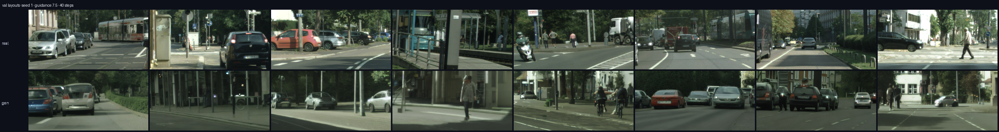

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L3 · GENERATE MORE IMAGES from the LoRA-adapted SD 1.5
# ----------------------------------------------------------------------
# Run after L1. Each call saves its own PNG, so re-running with a different
# SEED builds a gallery rather than overwriting.
#
#   N_IMG    images per grid
#   SEED     change for a different set from the same layouts
#   GUID     classifier-free guidance. 5 = looser and more varied,
#            7.5 = balanced, 12 = follows the prompt harder but can
#            oversaturate and flatten texture.
#   NSTEP    DDIM steps. 40 is fine; 60 is slightly cleaner and slower.
#   MODE     "val"    layouts from the validation split
#            "train"  layouts the model saw (sanity check — should be best)
#            "custom" your own prompts, no layout conditioning
# ════════════════════════════════════════════════════════════════════
N_IMG, SEED, GUID, NSTEP, MODE = 8, 1, 7.5, 40, "val"

CUSTOM = [
    "a photo of a german city street with 3 pedestrians crossing, dashcam view, daylight",
    "a photo of a german city street with 2 cyclists, dashcam view, overcast",
    "a photo of a narrow european street with 1 pedestrian, dashcam view, daylight",
    "a photo of a german city street with 6 cars in traffic, dashcam view, daylight",
    "a photo of a wide german boulevard with pedestrians and cyclists, dashcam view",
    "a photo of a german residential street with parked cars, dashcam view, daylight",
    "a photo of a city intersection with pedestrians waiting, dashcam view, daylight",
    "a photo of a german street with a cyclist and a pedestrian, dashcam view, daylight",
]

import numpy as np, torch, os
from PIL import Image, ImageDraw
from diffusers import DDIMScheduler

unet.eval(); adapter.eval()
sch = DDIMScheduler.from_config(pipe.scheduler.config)
sch.set_timesteps(NSTEP, device=dev)
LHc, LWc = LM.shape[-2], LM.shape[-1]


@torch.no_grad()
def embed(prompts):
    t_ = tok(prompts, padding="max_length", truncation=True,
             max_length=tok.model_max_length, return_tensors="pt")
    return txt(t_.input_ids.to(dev))[0].float()


@torch.no_grad()
def generate(ids=None, prompts=None, seed=SEED, guid=GUID):
    """ids → layout-conditioned from the cache. prompts → text only."""
    n = len(ids) if ids is not None else len(prompts)
    g = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(n, 4, LHc, LWc, generator=g, device=dev) * sch.init_noise_sigma
    if ids is not None:
        box, cls = BOX[ids], CLS[ids]
        cond = TXT[ids].float()
    else:
        box = torch.zeros(n, CLS.shape[1], 4, device=dev)
        cls = torch.zeros(n, CLS.shape[1], dtype=torch.long, device=dev)
        cond = embed(prompts)
    one, zero = torch.ones(n, device=dev), torch.zeros(n, device=dev)
    cu = torch.cat([NULL.float().expand(n, -1, -1), adapter(box, cls, zero)], 1)
    cc = torch.cat([cond, adapter(box, cls, one)], 1)
    for t in sch.timesteps:
        inp = sch.scale_model_input(torch.cat([z]*2), t)
        with torch.autocast("cuda", DTYPE):
            e = unet(inp, t, encoder_hidden_states=torch.cat([cu, cc])).sample
        eu, ec = e.float().chunk(2)
        z = sch.step(eu + guid*(ec-eu), t, z).prev_sample
    img = vae_sd.decode(z / VAE_SCALE).sample
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1).cpu().numpy()


def grid(imgs, real_ids=None, title="", path="out.png", tw=320, th=160):
    rows = 2 if real_ids is not None else 1
    cv = Image.new("RGB", (76 + len(imgs)*(tw+4), 26 + rows*(th+4)), (13, 16, 25))
    d = ImageDraw.Draw(cv); d.text((6, 8), title, fill=(232, 235, 242))
    for c, im in enumerate(imgs):
        if real_ids is not None:
            d.text((5, 30+th//2), "real", fill=(150, 156, 172))
            cv.paste(Image.fromarray(np.asarray(IMGS[int(real_ids[c])]))
                     .resize((tw, th), Image.LANCZOS), (76+c*(tw+4), 26))
        y = 26 + (th+4 if real_ids is not None else 0)
        d.text((5, y+th//2), "gen", fill=(150, 156, 172))
        cv.paste(Image.fromarray(im).resize((tw, th), Image.LANCZOS), (76+c*(tw+4), y))
    cv.save(path); return cv


os.makedirs(f"{OUT}/samples", exist_ok=True)
if MODE == "custom":
    ps = CUSTOM[:N_IMG]
    G = generate(prompts=ps, seed=SEED)
    p = f"{OUT}/samples/lora_custom_s{SEED}_g{GUID}.png"
    cv = grid(G, None, f"text-only · seed {SEED} · guidance {GUID}", p)
    for i, s in enumerate(ps): print(f"    [{i}] {s}")
else:
    pool = IDX[MODE]
    off = (SEED * N_IMG) % max(len(pool) - N_IMG, 1)
    ids = torch.from_numpy(pool[off:off+N_IMG]).to(dev)
    G = generate(ids=ids, seed=SEED)
    p = f"{OUT}/samples/lora_{MODE}_s{SEED}_g{GUID}.png"
    cv = grid(G, ids, f"{MODE} layouts · seed {SEED} · guidance {GUID} · "
                      f"{NSTEP} steps", p)
print(f"  ✓ {p}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L1b · CONTINUE LoRA TRAINING TO 6,000 STEPS
# ----------------------------------------------------------------------
# Resumes from the step-2000 checkpoint and trains 4,000 more (~22 min on L4).
#
# WHY LONGER: the layout adapter is zero-initialised, so it begins as a no-op
# and has to learn from scratch to bind box coordinates to spatial positions —
# while competing with a text prompt that already describes the scene content.
# At 2,000 steps the text was doing most of the work, which is why generated
# scenes matched the object COUNTS but not the object PLACEMENT.
#
# Run this INSTEAD of re-running L1. Everything it needs (unet, adapter, opt,
# TXT, NULL, scaler, sched, tok, txt) is already in memory from L1.
# If the session dropped, re-run L1 with STEPS = 6000 instead.
# ════════════════════════════════════════════════════════════════════
STEPS_NEW = 6000

import os, json, time, torch, torch.nn as nn

for _n in ("unet", "adapter", "opt", "scaler", "sched", "TXT", "NULL", "LORA_D"):
    assert _n in globals(), f"{_n} missing — run L1 first (or re-run L1 with STEPS=6000)"

ck_p, done_p = f"{LORA_D}/ckpt.pt", f"{LORA_D}/done.json"
assert os.path.exists(ck_p), f"no checkpoint at {ck_p} — run L1 first"

s = torch.load(ck_p, map_location=dev, weights_only=False)
unet.load_state_dict(s["unet"], strict=False)
adapter.load_state_dict(s["adapter"])
opt.load_state_dict(s["opt"])
step, hist = s["step"], s["hist"]
print(f"  ↻ resumed at step {step} → training to {STEPS_NEW}")
if step >= STEPS_NEW:
    print("  already at or past the target; raise STEPS_NEW to continue")

# RNG advanced past the steps already taken, so the second half of training
# does not replay the same batch order as the first.
gen  = torch.Generator(device=dev).manual_seed(1)
tids = torch.from_numpy(IDX["train"]).to(dev)
params = [p for p in unet.parameters() if p.requires_grad] + list(adapter.parameters())

t0 = time.time()
unet.train(); adapter.train()
while step < STEPS_NEW:
    p = tids[torch.randperm(len(tids), generator=gen, device=dev)]
    for i in range(0, len(p) - BS + 1, BS):
        ids = p[i:i+BS]
        fl = (torch.rand(BS, generator=gen, device=dev) < .5).long() \
             if LM.shape[1] > 1 else torch.zeros(BS, dtype=torch.long, device=dev)
        z0 = (LM[ids, fl].float() + LS[ids, fl].float() *
              torch.randn(LM[ids, fl].shape, generator=gen, device=dev)) * VAE_SCALE
        t = torch.randint(0, sched.config.num_train_timesteps, (BS,),
                          generator=gen, device=dev)
        eps = torch.randn(z0.shape, generator=gen, device=dev)
        zt = sched.add_noise(z0, eps, t)
        drop = (torch.rand(BS, generator=gen, device=dev) < CFG_DROP)
        emb = torch.where(drop[:, None, None], NULL.float().expand(BS, -1, -1),
                          TXT[ids].float())
        bx = torch.where(fl.bool()[:, None, None],
                         torch.stack([1-BOX[ids][..., 2], BOX[ids][..., 1],
                                      1-BOX[ids][..., 0], BOX[ids][..., 3]], -1),
                         BOX[ids])
        ctx = torch.cat([emb, adapter(bx, CLS[ids], (~drop).float())], 1)
        with torch.autocast("cuda", DTYPE):
            pred = unet(zt, t, encoder_hidden_states=ctx).sample
        loss = (pred.float() - eps).pow(2).mean()
        scaler.scale(loss).backward(); scaler.unscale_(opt)
        nn.utils.clip_grad_norm_(params, 1.0)
        scaler.step(opt); scaler.update(); opt.zero_grad(set_to_none=True)
        step += 1

        if step % 200 == 0:
            hist.append(dict(step=step, loss=loss.item()))
            el = time.time() - t0
            print(f"    {step:>5} loss {loss.item():.4f} · {el/60:.0f}m · eta "
                  f"{(STEPS_NEW-step)*el/max(step-s['step'],1)/60:.0f}m", flush=True)
        if step % 250 == 0 or step >= STEPS_NEW:
            torch.save({"step": step, "hist": hist, "opt": opt.state_dict(),
                        "unet": {k: v for k, v in unet.state_dict().items()
                                 if "lora" in k},
                        "adapter": adapter.state_dict()}, ck_p)
        if step >= STEPS_NEW: break

json.dump(hist, open(done_p, "w"))
print(f"  ✓ {step} steps · +{(time.time()-t0)/60:.1f} min this run")

# ── how much did the layout adapter actually wake up? ──────────────────
# It was zero-initialised, so its output norm starting near 0 and growing is
# the direct evidence that it is learning to use the boxes at all.
with torch.no_grad():
    _ids = torch.from_numpy(IDX["val"][:16]).to(dev)
    _tok = adapter(BOX[_ids], CLS[_ids], torch.ones(16, device=dev))
    _txt = TXT[_ids].float()
    print(f"  adapter token norm {_tok.norm(dim=-1).mean():.4f} · "
          f"text token norm {_txt.norm(dim=-1).mean():.4f} · "
          f"ratio {(_tok.norm(dim=-1).mean()/_txt.norm(dim=-1).mean()):.3f}")
    print("  ratio near 0 → layout still ignored; rising → boxes being used")

  ↻ resumed at step 2000 → training to 6000
     2200 loss 0.2140 · 1m · eta 21m
     2400 loss 0.1233 · 2m · eta 20m
     2600 loss 0.1324 · 3m · eta 19m
     2800 loss 0.2301 · 4m · eta 18m
     3000 loss 0.0768 · 6m · eta 17m
     3200 loss 0.1767 · 7m · eta 16m
     3400 loss 0.1677 · 8m · eta 15m
     3600 loss 0.1433 · 9m · eta 13m
     3800 loss 0.0950 · 10m · eta 12m
     4000 loss 0.1939 · 11m · eta 11m
     4200 loss 0.1612 · 12m · eta 10m
     4400 loss 0.1760 · 13m · eta 9m
     4600 loss 0.1444 · 15m · eta 8m
     4800 loss 0.1917 · 16m · eta 7m
     5000 loss 0.1816 · 17m · eta 6m
     5200 loss 0.1705 · 18m · eta 4m
     5400 loss 0.1156 · 19m · eta 3m
     5600 loss 0.1490 · 20m · eta 2m
     5800 loss 0.1927 · 21m · eta 1m
     6000 loss 0.2216 · 22m · eta 0m
  ✓ 6000 steps · +22.4 min this run
  adapter token norm 5.7956 · text token norm 28.1273 · ratio 0.206
  ratio near 0 → layout still ignored; rising → boxes being used


  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/lora6k_val_s1.png


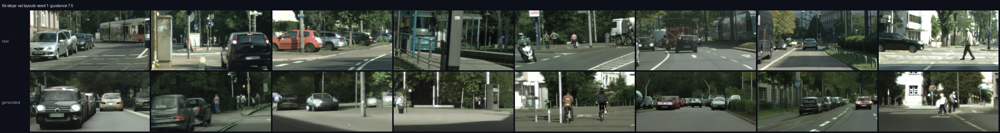

  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/lora6k_val_s2.png
  ✓ /content/drive/MyDrive/pa_d2it/e2e/samples/lora6k_val_s3.png

  LAYOUT-CONTROL TEST · same prompt + same noise, swapped boxes


In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L4 · GENERATE AFTER EXTENDED TRAINING  (+ layout-control test)
# ----------------------------------------------------------------------
# Run after L1b. Produces two things:
#
#   1. A gallery from real validation layouts, with the real frame above each
#      generated one — the same view L3 gave, so you can compare at seed 1.
#
#   2. A LAYOUT-CONTROL TEST that answers the question the eye cannot. The
#      same prompt is generated three times with DIFFERENT box layouts and
#      the SAME noise seed. If the adapter is working, the images differ in
#      object placement; if the text is doing all the work, they are nearly
#      identical. Judging placement by comparing a generated scene to an
#      unrelated real photo cannot distinguish these cases — this can.
# ════════════════════════════════════════════════════════════════════
N_IMG, SEEDS, GUID, NSTEP = 8, (1, 2, 3), 7.5, 40

import numpy as np, torch, os
from PIL import Image, ImageDraw
from diffusers import DDIMScheduler

unet.eval(); adapter.eval()
sch = DDIMScheduler.from_config(pipe.scheduler.config)
sch.set_timesteps(NSTEP, device=dev)
LHc, LWc = LM.shape[-2], LM.shape[-1]
os.makedirs(f"{OUT}/samples", exist_ok=True)


@torch.no_grad()
def gen_from(ids, seed, guid=GUID, box_override=None, cls_override=None):
    """Layout-conditioned generation. box/cls_override lets you keep the
    prompt fixed while swapping the boxes — the basis of the control test."""
    n = len(ids)
    box = BOX[ids] if box_override is None else box_override
    cls = CLS[ids] if cls_override is None else cls_override
    g = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(n, 4, LHc, LWc, generator=g, device=dev) * sch.init_noise_sigma
    one, zero = torch.ones(n, device=dev), torch.zeros(n, device=dev)
    cu = torch.cat([NULL.float().expand(n, -1, -1), adapter(box, cls, zero)], 1)
    cc = torch.cat([TXT[ids].float(),               adapter(box, cls, one)], 1)
    for t in sch.timesteps:
        inp = sch.scale_model_input(torch.cat([z]*2), t)
        with torch.autocast("cuda", DTYPE):
            e = unet(inp, t, encoder_hidden_states=torch.cat([cu, cc])).sample
        eu, ec = e.float().chunk(2)
        z = sch.step(eu + guid*(ec-eu), t, z).prev_sample
    img = vae_sd.decode(z / VAE_SCALE).sample
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1).cpu().numpy()


def paste_grid(rows, labels, path, title, tw=320, th=160):
    n = len(rows[0])
    cv = Image.new("RGB", (80 + n*(tw+4), 28 + len(rows)*(th+4)), (13, 16, 25))
    d = ImageDraw.Draw(cv); d.text((6, 9), title, fill=(232, 235, 242))
    for r, (row, lab) in enumerate(zip(rows, labels)):
        y = 28 + r*(th+4)
        d.text((5, y+th//2-4), lab[:11], fill=(152, 158, 174))
        for c, im in enumerate(row):
            im = im if isinstance(im, Image.Image) else Image.fromarray(im)
            cv.paste(im.resize((tw, th), Image.LANCZOS), (80+c*(tw+4), y))
    cv.save(path); return cv


# ══ 1 · galleries at several seeds ═════════════════════════════════════
pool = IDX["val"]
for sd in SEEDS:
    off = (sd*N_IMG) % max(len(pool)-N_IMG, 1)
    ids = torch.from_numpy(pool[off:off+N_IMG]).to(dev)
    G = gen_from(ids, seed=sd)
    p = f"{OUT}/samples/lora6k_val_s{sd}.png"
    cv = paste_grid([[np.asarray(IMGS[int(k)]) for k in ids], G],
                    ["real", "generated"], p,
                    f"6k steps · val layouts · seed {sd} · guidance {GUID}")
    print(f"  ✓ {p}")
    if sd == SEEDS[0]:
        try:
            from IPython.display import display; display(cv)
        except Exception: pass


# ══ 2 · layout-control test ════════════════════════════════════════════
# Same prompt, same noise, three different box layouts. Differences between
# rows are attributable to the boxes alone.
print(f"\n{'='*70}\n  LAYOUT-CONTROL TEST · same prompt + same noise, swapped boxes\n{'='*70}")
base_ids = torch.from_numpy(pool[:N_IMG]).to(dev)
donors = [int(pool[(50+j*37) % len(pool)]) for j in range(2)]

rows, labs = [], []
rows.append(gen_from(base_ids, seed=11)); labs.append("own boxes")
for j, dj in enumerate(donors):
    bo = BOX[dj][None].expand(N_IMG, -1, -1).contiguous()
    co = CLS[dj][None].expand(N_IMG, -1).contiguous()
    rows.append(gen_from(base_ids, seed=11, box_override=bo, cls_override=co))
    labs.append(f"boxes of {dj}")
rows.append([np.asarray(IMGS[int(k)]) for k in base_ids]); labs.append("real")

p2 = f"{OUT}/samples/lora6k_layout_control.png"
cv2 = paste_grid(rows, labs, p2,
                 "layout control · identical prompt and noise, different boxes")
print(f"  ✓ {p2}")

# quantify: how much does swapping boxes change the image?
a = rows[0].astype(np.float32); b = rows[1].astype(np.float32)
diff = float(np.abs(a-b).mean())
print(f"\n  mean |Δpixel| when only the boxes change: {diff:.2f} / 255")
print("    < 2   → layout is being ignored; the text prompt drives everything")
print("    5-20  → boxes measurably influence the image")
print("    > 20  → strong layout control")
with torch.no_grad():
    _t = adapter(BOX[base_ids], CLS[base_ids], torch.ones(N_IMG, device=dev))
    _x = TXT[base_ids].float()
    print(f"  adapter/text token-norm ratio: "
          f"{(_t.norm(dim=-1).mean()/_x.norm(dim=-1).mean()):.3f}")
try:
    from IPython.display import display; display(cv2)
except Exception: pass

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L5 · ALLOCATION ON TOP OF THE LoRA MODEL
#          importance vs entropy, on images good enough to judge by eye
# ----------------------------------------------------------------------
# This joins the two halves of the project.
#
#   The LoRA model (L1/L1b) produces convincing Cityscapes-domain scenes but
#   knows nothing about allocation. The allocation work measured importance
#   against entropy but on a from-scratch model whose samples were texture.
#   Here the allocation runs on top of the LoRA model, so the comparison is
#   finally visible rather than only measurable.
#
# THE MECHANISM — a spatial guidance field. Classifier-free guidance normally
# uses one scalar for the whole frame:
#       eps = eps_uncond + g * (eps_cond - eps_uncond)
# Here g becomes g(x,y): high on cells the signal selects, low elsewhere.
#
# MATCHED BY CONSTRUCTION, and this is what makes the comparison mean anything
#   * identical fine-cell budget (r_fine) for every arm
#   * identical noise seed, prompt, layout boxes and step count
#   * the uniform arm's constant guidance equals the area-weighted MEAN of the
#     regional field, so total guidance budget is equal:
#         E[g] = g_lo + (g_hi - g_lo) * r_fine
#   * COMPOSITION LOCK: the first LOCK fraction of steps runs uniform for all
#     arms. Early diffusion steps decide composition, late steps decide detail.
#     Without the lock each arm generates a DIFFERENT SCENE and the comparison
#     is vacuous — a failure observed directly earlier in this project.
#
# Run after L1b. ~4 min.
# ════════════════════════════════════════════════════════════════════
N_SHOW, SEED, NSTEP = 6, 3, 40
G_LO, G_HI, LOCK = 5.0, 11.0, 0.35
R_FINE_L = 0.25

import numpy as np, torch, torch.nn.functional as F, os, math
from PIL import Image, ImageDraw
from diffusers import DDIMScheduler

G_UNI = G_LO + (G_HI - G_LO) * R_FINE_L          # matched-budget control
print(f"  guidance  coarse {G_LO} · fine {G_HI} · uniform {G_UNI} (= E[g])")

unet.eval(); adapter.eval()
sch = DDIMScheduler.from_config(pipe.scheduler.config)
LHc, LWc = LM.shape[-2], LM.shape[-1]
K_L = int(round(R_FINE_L * LHc * LWc))
os.makedirs(f"{OUT}/samples", exist_ok=True)


def topk_bin(score, k=K_L):
    f = score.flatten(); out = torch.zeros_like(f)
    out[torch.topk(f, k).indices] = 1.0
    return out.view_as(score)


def imp_mask(k):
    m = torch.zeros(LHc, LWc, device=dev)
    for (x0, y0, x1, y1), ci in zip(BOX[k].tolist(), CLS[k].tolist()):
        if x1 <= x0 or y1 <= y0: continue
        w = 1.0 if ci in VRU_IDS else (0.6 if ci in VEH_IDS else 0.0)
        if w == 0: continue
        i0, i1 = int(y0*LHc), max(int(y0*LHc)+1, int(math.ceil(y1*LHc)))
        j0, j1 = int(x0*LWc), max(int(x0*LWc)+1, int(math.ceil(x1*LWc)))
        sl = (slice(max(0, i0), min(LHc, i1)), slice(max(0, j0), min(LWc, j1)))
        m[sl] = torch.maximum(m[sl], torch.tensor(w, device=dev))
    return topk_bin(m)


def ent_mask(k, bins=32):
    g = np.asarray(Image.fromarray(np.asarray(IMGS[k])).convert("L"))
    ph, pw = g.shape[0]//LHc, g.shape[1]//LWc
    q = (g[:LHc*ph, :LWc*pw].reshape(LHc, ph, LWc, pw).transpose(0, 2, 1, 3)
         .reshape(LHc*LWc, ph*pw) // (256//bins)).astype(np.int8)
    c = np.stack([(q == b).sum(1) for b in range(bins)], 1).astype(np.float32)
    p = c / c.sum(1, keepdims=True).clip(1e-8)
    e = -(np.where(p > 0, p*np.log2(p.clip(1e-12)), 0)).sum(1).reshape(LHc, LWc)
    return topk_bin(torch.from_numpy(e).to(dev))


def g_field(mask):
    """cell mask → guidance field. Blurred, not hard-edged: background error
    tracks boundary count (Spearman rho = +0.90), so hundreds of sharp seams
    would reproduce the fragmentation penalty by construction."""
    if mask is None:
        return torch.full((1, 1, LHc, LWc), G_UNI, device=dev)
    m = mask[None, None].float()
    m = F.avg_pool2d(F.pad(m, (1, 1, 1, 1), mode="replicate"), 3, stride=1)
    return G_LO + (G_HI - G_LO) * m


@torch.no_grad()
def gen_alloc(k, mask, seed=SEED, steps=NSTEP, lock=LOCK):
    sch.set_timesteps(steps, device=dev)
    ids = torch.tensor([k], device=dev)
    gf, gu = g_field(mask), torch.full((1, 1, LHc, LWc), G_UNI, device=dev)
    g = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(1, 4, LHc, LWc, generator=g, device=dev) * sch.init_noise_sigma
    one, zero = torch.ones(1, device=dev), torch.zeros(1, device=dev)
    cu = torch.cat([NULL.float().expand(1, -1, -1), adapter(BOX[ids], CLS[ids], zero)], 1)
    cc = torch.cat([TXT[ids].float(),               adapter(BOX[ids], CLS[ids], one)], 1)
    n_lock = int(lock*steps)
    for i, t in enumerate(sch.timesteps):
        inp = sch.scale_model_input(torch.cat([z]*2), t)
        with torch.autocast("cuda", DTYPE):
            e = unet(inp, t, encoder_hidden_states=torch.cat([cu, cc])).sample
        eu, ec = e.float().chunk(2)
        gg = gu if i < n_lock else gf                # composition locked first
        z = sch.step(eu + gg*(ec-eu), t, z).prev_sample
    img = vae_sd.decode(z / VAE_SCALE).sample
    return ((img.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1)[0].cpu().numpy()


def tint(img, mask, rgb, a=.40):
    im = np.asarray(img).astype(np.float32)
    m = np.asarray(Image.fromarray((mask.cpu().numpy()*255).astype(np.uint8))
                   .resize((im.shape[1], im.shape[0]), Image.NEAREST)
                   ).astype(np.float32)[..., None]/255
    return Image.fromarray((im*(1-a*m) + np.array(rgb, np.float32)*a*m)
                           .clip(0, 255).astype(np.uint8))


# pick val layouts that actually contain VRUs — otherwise nothing to allocate to
cand = [int(k) for k in IDX["val"]
        if any(c in VRU_IDS for c in CLS[int(k)].tolist())][:60]
pick = sorted(cand, key=lambda k: -sum(1 for c in CLS[k].tolist() if c in VRU_IDS))[:N_SHOW]
print(f"  layouts {pick}")

ROWS, hits = {}, {"importance": [], "entropy": []}
for k in pick:
    mi, me = imp_mask(k), ent_mask(k)
    v = torch.zeros(LHc, LWc, device=dev)
    for (x0, y0, x1, y1), ci in zip(BOX[k].tolist(), CLS[k].tolist()):
        if ci in VRU_IDS and x1 > x0 and y1 > y0:
            v[max(0, int(y0*LHc)):min(LHc, max(int(y0*LHc)+1, int(math.ceil(y1*LHc)))),
              max(0, int(x0*LWc)):min(LWc, max(int(x0*LWc)+1, int(math.ceil(x1*LWc))))] = 1
    for nm, m in (("importance", mi), ("entropy", me)):
        hits[nm].append(float((m*v).sum()/v.sum().clamp_min(1)))
    ROWS[k] = dict(uniform=gen_alloc(k, None), importance=gen_alloc(k, mi),
                   entropy=gen_alloc(k, me), mi=mi, me=me)
    print(f"    k{k}: importance reaches {hits['importance'][-1]*100:.0f}% of VRU "
          f"cells · entropy {hits['entropy'][-1]*100:.0f}%", flush=True)

print(f"\n  mean VRU-cell recall — importance {np.mean(hits['importance'])*100:.1f} % · "
      f"entropy {np.mean(hits['entropy'])*100:.1f} % · chance {R_FINE_L*100:.0f} %")

# ── figure ─────────────────────────────────────────────────────────────
TW, TH = 300, 150
cols = ["real", "uniform", "entropy → where", "importance → where",
        "entropy", "importance"]
cv = Image.new("RGB", (30 + len(cols)*(TW+5), 30 + len(pick)*(TH+5)), (13, 16, 25))
d = ImageDraw.Draw(cv)
for c, nm in enumerate(cols):
    d.text((30 + c*(TW+5) + 3, 10), nm.upper(), fill=(233, 236, 243))
for r, k in enumerate(pick):
    y = 30 + r*(TH+5); R = ROWS[k]
    panels = [
        Image.fromarray(np.asarray(IMGS[k])),
        Image.fromarray(R["uniform"]),
        tint(R["entropy"],    R["me"], (60, 195, 205)),
        tint(R["importance"], R["mi"], (232, 40, 96)),
        Image.fromarray(R["entropy"]),
        Image.fromarray(R["importance"]),
    ]
    for c, p_ in enumerate(panels):
        cv.paste(p_.resize((TW, TH), Image.LANCZOS), (30 + c*(TW+5), y))
out_p = f"{OUT}/samples/lora_allocation.png"
cv.save(out_p)
print(f"  ✓ {out_p}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL L6 · DEMO FRAMES — 10 curated entropy-vs-importance pairs
# ----------------------------------------------------------------------
# Writes individual PNGs you can drop straight into a video editor:
#
#   demo/NN_a_scene.png        the generated street, clean
#   demo/NN_b_entropy_map.png  where entropy spent its budget   (teal)
#   demo/NN_c_importance_map.png  where importance spent it     (pink)
#   demo/NN_d_entropy_out.png  entropy-guided output
#   demo/NN_e_importance_out.png  importance-guided output
#   demo/NN_f_side_by_side.png stacked comparison with recall printed
#
# Every arm shares the same base scene, seed, prompt, layout and step count;
# only the guidance field differs. The first 35 % of steps run uniform for
# all arms (composition lock) so the arms cannot diverge into different
# scenes — without it the comparison is between two pictures, not two
# allocations.
#
# Scenes are RANKED by how much the two signals disagree, so the ten you get
# are the ten where there is actually something to see. Scenes where both
# signals pick the same cells are uninformative and are skipped.
#
# Run after L1 (or L1b). ~6 min.
# ════════════════════════════════════════════════════════════════════
N_DEMO, SEED, NSTEP = 10, 3, 40
G_LO, G_HI, LOCK, R_FINE_D = 5.0, 11.0, 0.35, 0.25
SCAN = 120                       # candidates ranked before picking N_DEMO

import numpy as np, torch, torch.nn.functional as F, os, math, json
from PIL import Image, ImageDraw
from diffusers import DDIMScheduler

DEMO = f"{OUT}/demo"; os.makedirs(DEMO, exist_ok=True)
G_UNI = G_LO + (G_HI - G_LO) * R_FINE_D
unet.eval(); adapter.eval()
sch = DDIMScheduler.from_config(pipe.scheduler.config)
LHc, LWc = LM.shape[-2], LM.shape[-1]
K_D = int(round(R_FINE_D * LHc * LWc))
print(f"  guidance {G_LO} → {G_HI} · uniform {G_UNI} · budget {K_D}/{LHc*LWc}")


def topk_bin(sc, k=K_D):
    f = sc.flatten(); o = torch.zeros_like(f)
    o[torch.topk(f, k).indices] = 1.0
    return o.view_as(sc)


def imp_mask(k):
    m = torch.zeros(LHc, LWc, device=dev)
    for (x0, y0, x1, y1), ci in zip(BOX[k].tolist(), CLS[k].tolist()):
        if x1 <= x0 or y1 <= y0: continue
        w = 1.0 if ci in VRU_IDS else (0.6 if ci in VEH_IDS else 0.0)
        if w == 0: continue
        i0, i1 = int(y0*LHc), max(int(y0*LHc)+1, int(math.ceil(y1*LHc)))
        j0, j1 = int(x0*LWc), max(int(x0*LWc)+1, int(math.ceil(x1*LWc)))
        sl = (slice(max(0, i0), min(LHc, i1)), slice(max(0, j0), min(LWc, j1)))
        m[sl] = torch.maximum(m[sl], torch.tensor(w, device=dev))
    return topk_bin(m)


def ent_mask(k, bins=32):
    g = np.asarray(Image.fromarray(np.asarray(IMGS[k])).convert("L"))
    ph, pw = g.shape[0]//LHc, g.shape[1]//LWc
    q = (g[:LHc*ph, :LWc*pw].reshape(LHc, ph, LWc, pw).transpose(0, 2, 1, 3)
         .reshape(LHc*LWc, ph*pw) // (256//bins)).astype(np.int8)
    c = np.stack([(q == b).sum(1) for b in range(bins)], 1).astype(np.float32)
    p_ = c / c.sum(1, keepdims=True).clip(1e-8)
    e = -(np.where(p_ > 0, p_*np.log2(p_.clip(1e-12)), 0)).sum(1).reshape(LHc, LWc)
    return topk_bin(torch.from_numpy(e).to(dev))


def vru_cells(k):
    v = torch.zeros(LHc, LWc, device=dev)
    for (x0, y0, x1, y1), ci in zip(BOX[k].tolist(), CLS[k].tolist()):
        if ci in VRU_IDS and x1 > x0 and y1 > y0:
            v[max(0, int(y0*LHc)):min(LHc, max(int(y0*LHc)+1, int(math.ceil(y1*LHc)))),
              max(0, int(x0*LWc)):min(LWc, max(int(x0*LWc)+1, int(math.ceil(x1*LWc))))] = 1
    return v


def g_field(mask):
    if mask is None:
        return torch.full((1, 1, LHc, LWc), G_UNI, device=dev)
    m = mask[None, None].float()
    m = F.avg_pool2d(F.pad(m, (1, 1, 1, 1), mode="replicate"), 3, stride=1)
    return G_LO + (G_HI - G_LO) * m


@torch.no_grad()
def render(k, mask, seed=SEED, steps=NSTEP):
    sch.set_timesteps(steps, device=dev)
    ids = torch.tensor([k], device=dev)
    gf = g_field(mask); gu = torch.full((1, 1, LHc, LWc), G_UNI, device=dev)
    g = torch.Generator(device=dev).manual_seed(seed)
    z = torch.randn(1, 4, LHc, LWc, generator=g, device=dev) * sch.init_noise_sigma
    one, zero = torch.ones(1, device=dev), torch.zeros(1, device=dev)
    cu = torch.cat([NULL.float().expand(1, -1, -1), adapter(BOX[ids], CLS[ids], zero)], 1)
    cc = torch.cat([TXT[ids].float(),               adapter(BOX[ids], CLS[ids], one)], 1)
    nl = int(LOCK*steps)
    for i, t in enumerate(sch.timesteps):
        inp = sch.scale_model_input(torch.cat([z]*2), t)
        with torch.autocast("cuda", DTYPE):
            e = unet(inp, t, encoder_hidden_states=torch.cat([cu, cc])).sample
        eu, ec = e.float().chunk(2)
        z = sch.step(eu + (gu if i < nl else gf)*(ec-eu), t, z).prev_sample
    im = vae_sd.decode(z / VAE_SCALE).sample
    return ((im.clamp(-1, 1)+1)*127.5).byte().permute(0, 2, 3, 1)[0].cpu().numpy()


def tint(img, mask, rgb, a=.45):
    im = np.asarray(img).astype(np.float32)
    m = np.asarray(Image.fromarray((mask.cpu().numpy()*255).astype(np.uint8))
                   .resize((im.shape[1], im.shape[0]), Image.NEAREST)
                   ).astype(np.float32)[..., None]/255
    return Image.fromarray((im*(1-a*m) + np.array(rgb, np.float32)*a*m)
                           .clip(0, 255).astype(np.uint8))


# ── rank scenes by DISAGREEMENT — where the two signals actually differ ──
print(f"  ranking {SCAN} candidates by signal disagreement …")
cand = []
for k in IDX["val"][:SCAN]:
    k = int(k)
    v = vru_cells(k)
    if v.sum() < 8: continue                      # need enough VRU to matter
    mi, me = imp_mask(k), ent_mask(k)
    inter = float((mi*me).sum()); union = float(((mi+me) > 0).sum())
    iou = inter/max(union, 1)
    ri = float((mi*v).sum()/v.sum()); re = float((me*v).sum()/v.sum())
    cand.append((k, iou, ri, re, ri-re))
cand.sort(key=lambda c: -c[4])                    # biggest recall gap first
pick = cand[:N_DEMO]
print(f"  selected {len(pick)} scenes · mean recall gap "
      f"{np.mean([c[4] for c in pick])*100:.0f} pp")

TW, TH = 768, 384
meta = []
for n, (k, iou, ri, re, gap) in enumerate(pick, 1):
    mi, me = imp_mask(k), ent_mask(k)
    base = Image.fromarray(render(k, None))
    oe   = Image.fromarray(render(k, me))
    oi   = Image.fromarray(render(k, mi))
    big = lambda im: im.resize((TW, TH), Image.LANCZOS)
    tag = f"{n:02d}"
    big(base).save(f"{DEMO}/{tag}_a_scene.png")
    big(tint(oe, me, (55, 200, 212))).save(f"{DEMO}/{tag}_b_entropy_map.png")
    big(tint(oi, mi, (235, 45, 100))).save(f"{DEMO}/{tag}_c_importance_map.png")
    big(oe).save(f"{DEMO}/{tag}_d_entropy_out.png")
    big(oi).save(f"{DEMO}/{tag}_e_importance_out.png")

    # stacked comparison, captioned with the measured recall
    H = 2*TH + 118
    cv = Image.new("RGB", (TW, H), (13, 16, 25)); d = ImageDraw.Draw(cv)
    d.text((14, 14), "ENTROPY  (D\u00b2iT)", fill=(90, 214, 224))
    d.text((TW-330, 14), f"reaches {re*100:.0f}% of pedestrian cells",
           fill=(150, 158, 176))
    cv.paste(big(tint(oe, me, (55, 200, 212))), (0, 40))
    d.text((14, TH+52), "IMPORTANCE  (ours)", fill=(244, 90, 138))
    d.text((TW-330, TH+52), f"reaches {ri*100:.0f}% of pedestrian cells",
           fill=(150, 158, 176))
    cv.paste(big(tint(oi, mi, (235, 45, 100))), (0, TH+78))
    cv.save(f"{DEMO}/{tag}_f_side_by_side.png")

    meta.append(dict(n=n, k=k, mask_iou=round(iou, 3),
                     recall_importance=round(ri, 3), recall_entropy=round(re, 3),
                     gap_pp=round(gap*100, 1)))
    print(f"    {tag}  k{k:<5} importance {ri*100:5.1f}% · entropy {re*100:5.1f}% "
          f"· gap {gap*100:4.1f} pp · mask IoU {iou:.2f}", flush=True)

json.dump(meta, open(f"{DEMO}/demo_frames.json", "w"), indent=2)
print(f"\n  ✓ {len(pick)*6} PNGs → {DEMO}")
print(f"  suggested cut: a_scene → b_entropy_map → c_importance_map → f_side_by_side")

# contact sheet so you can pick favourites at a glance
CW, CH = 300, 150
sheet = Image.new("RGB", (24+2*(CW+8), 30+len(pick)*(CH+8)), (13, 16, 25))
sd_ = ImageDraw.Draw(sheet)
sd_.text((12, 9), "ENTROPY", fill=(90, 214, 224))
sd_.text((24+CW+8, 9), "IMPORTANCE", fill=(244, 90, 138))
for i, m in enumerate(meta):
    y = 30 + i*(CH+8)
    sheet.paste(Image.open(f"{DEMO}/{m['n']:02d}_b_entropy_map.png").resize((CW, CH)), (12, y))
    sheet.paste(Image.open(f"{DEMO}/{m['n']:02d}_c_importance_map.png").resize((CW, CH)), (24+CW+8, y))
sheet.save(f"{DEMO}/00_contact_sheet.png")
print(f"  ✓ contact sheet → {DEMO}/00_contact_sheet.png")
try:
    from IPython.display import display; display(sheet)
except Exception: pass